# The baseline approaches for calculating screen embeddings

In [11]:
# importing libraries
from sentence_transformers import SentenceTransformer, LoggingHandler
from concurrent.futures import ThreadPoolExecutor
import numpy as np
import logging
import math
import os
import time
import scipy
import json
from concurrent.futures import ThreadPoolExecutor
from rico_utils import get_all_texts_from_rico_screen, ScreenInfo
from embedding_utils import get_embedding_from_text, get_an_aggregated_embedding_from_texts, get_embeddings_from_texts
from rico_dao import read_embedding_from_file
from nltk.tokenize import word_tokenize
from IPython.display import Image

### Load the [Sentence-BERT](https://github.com/UKPLab/sentence-transformers) model [[Paper](https://arxiv.org/abs/1908.10084)]

In [2]:
# load the Sentence-BERT model
logging.basicConfig(format='%(asctime)s - %(message)s',
                            datefmt='%Y-%m-%d %H:%M:%S',
                            level=logging.INFO,
                            handlers=[LoggingHandler()])
sentence_bert_model = SentenceTransformer('bert-base-nli-mean-tokens')

2020-05-26 03:43:27 - Load pretrained SentenceTransformer: bert-base-nli-mean-tokens
2020-05-26 03:43:27 - Did not find a / or \ in the name. Assume to download model from server
2020-05-26 03:43:27 - Load SentenceTransformer from folder: /home/toby/.cache/torch/sentence_transformers/public.ukp.informatik.tu-darmstadt.de_reimers_sentence-transformers_v0.2_bert-base-nli-mean-tokens.zip
2020-05-26 03:43:27 - loading configuration file /home/toby/.cache/torch/sentence_transformers/public.ukp.informatik.tu-darmstadt.de_reimers_sentence-transformers_v0.2_bert-base-nli-mean-tokens.zip/0_BERT/config.json
2020-05-26 03:43:27 - Model config {
  "attention_probs_dropout_prob": 0.1,
  "finetuning_task": null,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "id2label": {
    "0": "LABEL_0",
    "1": "LABEL_1"
  },
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "is_decoder": false,
  "label2id": {
    "LABEL_0": 0,
    "LABEL_1": 1
  },
  "layer_norm_eps":

### Load the [GloVe](https://nlp.stanford.edu/projects/glove/) model [[Paper](https://nlp.stanford.edu/pubs/glove.pdf]

In [15]:
# load the GloVe (https://nlp.stanford.edu/projects/glove/) (https://nlp.stanford.edu/pubs/glove.pdf) model

glove_token_embedding_dict = {}
vocab_count = 0
print ('Loading the GloVe word embeddings')
tic = time.perf_counter()

with open("./glove/glove.6B/glove.6B.300d.txt", 'r') as f:
    for line in f:
            values = line.split()
            word = values[0]
            vector = np.asarray(values[1:], "float32")
            glove_token_embedding_dict[word] = vector
            vocab_count += 1
            
toc = time.perf_counter()

            
print ('Loaded the GloVe word embeddings for %d words in %.4f seconds' % (vocab_count, toc - tic))


Loading the GloVe word embeddings
Finished loading the GloVe word embeddings for 400000 words in 43.0885 seconds


### Load the screens from the [RICO dataset](http://interactionmining.org/rico) [[Paper](http://ranjithakumar.net/resources/rico.pdf)]

In [14]:
# load the screens
rico_dir = './datasets/filtered_traces'
embedding_dir = './embeddings/filtered_traces'

"""
rico_dir = './datasets/combined'
embedding_dir = './embeddings/combined'
"""
tic = time.perf_counter()

# populate screen_info_text_label_list_dict
with open(embedding_dir + '/' + 'rico_screen_id_screen_info_dict' + '.json', 'r') as f:
    rico_screen_id_screen_info_dict_json = f.read()
    rico_screen_id_screen_info_dict_dict = json.loads(rico_screen_id_screen_info_dict_json)
    rico_screen_id_screen_info_dict = {}
    for rico_screen_id, screen_info_dict in rico_screen_id_screen_info_dict_dict.items():
        rico_screen_id_screen_info_dict[rico_screen_id] = ScreenInfo(**screen_info_dict)

with open(embedding_dir + '/' + 'rico_screen_id_text_label_list_dict' + '.json', 'r') as f:
    rico_screen_id_text_label_list_dict_json = f.read()
    rico_screen_id_text_label_list_dict = json.loads(rico_screen_id_text_label_list_dict_json)
    
toc = time.perf_counter()

# load the screen info
print("Loaded %d screens in %.3f seconds" % (len(rico_screen_id_screen_info_dict), toc - tic))

Loaded 66256 screens in 0.769 seconds


### Calculate embeddings for screens

Methods for generating the embedding for a screen:
* Method 1: aggregated embedding of all the text labels
* Method 2: aggregated embedding of all the tokens
* Method 3: embedding of all the text labels concated together

In [18]:
method1_rico_screen_id_embedding_dict = {}
method2a_rico_screen_id_embedding_dict = {}
method2b_rico_screen_id_embedding_dict = {}
method3_rico_screen_id_embedding_dict = {}

executor = ThreadPoolExecutor(10)
tic = time.perf_counter()
dict_load_count = 0

def load_dict_task(embedding_dir, method_name, rico_screen_id, dict_to_use):
    embedding = read_embedding_from_file(embedding_dir + '/' + method_name + '/', rico_screen_id)
    if not embedding is None:
        dict_to_use[rico_screen_id] = embedding
        dict_load_count += 1
    return 'done'

# Method 1: populate method1_screen_info_embedding_dict using Sentence-BERT
for rico_screen_id, screen_info in rico_screen_id_screen_info_dict.items():
    future = executor.submit(load_dict_task, embedding_dir, 'method1', rico_screen_id, method1_rico_screen_id_embedding_dict)
    

# Method 2a: populate method2_screen_info_embedding_dict using Sentence-BERT
for rico_screen_id, screen_info in rico_screen_id_screen_info_dict.items():
    executor.submit(load_dict_task, embedding_dir, 'method2a', rico_screen_id, method2a_rico_screen_id_embedding_dict)

# Method 2b: populate method2_screen_info_embedding_dict using GloVe
for rico_screen_id, screen_info in rico_screen_id_screen_info_dict.items():
    executor.submit(load_dict_task, embedding_dir, 'method2b', rico_screen_id, method2b_rico_screen_id_embedding_dict)

# Method 3: populate method3_screen_info_embedding_dict using Sentence-BERT
for rico_screen_id, screen_info in rico_screen_id_screen_info_dict.items():
    executor.submit(load_dict_task, embedding_dir, 'method3', rico_screen_id, method3_rico_screen_id_embedding_dict)

executor.shutdown(wait=True)
toc = time.perf_counter()



Loaded 0 embeddings in 137.267 seconds


In [24]:
print ('method1', len(method1_rico_screen_id_embedding_dict))
print ('method2a', len(method2a_rico_screen_id_embedding_dict))
print ('method2b', len(method2b_rico_screen_id_embedding_dict))
print ('method3', len(method3_rico_screen_id_embedding_dict))
print("Finished loading embeddings in %.3f seconds" % (toc - tic))

method1 61311
method2a 61311
method2b 60877
method3 61311
Finished loading embeddings in 137.267 seconds


### Helper functions for finding the most similar embeddings

In [25]:
# get the most similar n embeddings for src_embedding in screen_info_embedding_dict
def get_most_relevant_embeddings(src_embedding: np.ndarray, rico_id_embedding_dict: dict, n: int):
    screen_info_similarity_list = []
    for rico_id, embedding in rico_id_embedding_dict.items():
        if (embedding is None or src_embedding is None):
            continue
        if ((isinstance(embedding, int)) and embedding == 0):
            continue
        if ((isinstance(src_embedding, int)) and src_embedding == 0):
            continue
        entry = {}
        entry['rico_id'] = rico_id
        entry['score'] = scipy.spatial.distance.cosine(src_embedding, embedding)
        screen_info_similarity_list.append(entry)
    screen_info_similarity_list.sort(key=lambda x: x['score'])
    return screen_info_similarity_list[:n]


def get_most_relevant_embeddings_by_id(rico_id, rico_id_embedding_dict: dict, n: int):
    return get_most_relevant_embeddings(rico_id_embedding_dict[rico_id], rico_id_embedding_dict, n)

### Helper functions for displaying RICO results

In [26]:
with open(embedding_dir + '/' + 'rico_screen_id_screenshot_path_dict' + '.json', 'r') as f:
    rico_screen_id_screenshot_path_dict_json = f.read()
    rico_screen_id_screenshot_path_dict = json.loads(rico_screen_id_screenshot_path_dict_json)

def show_rico_image(rico_id):
    path = rico_dir + '/' + str(rico_id) + '.jpg'
    if not os.path.exists(path):
        path = rico_screen_id_screenshot_path_dict[rico_id]
    display(Image(filename=path, height=480, width=270))
    print (path)
    
        
def display_rico_result(rico_id: int):
    screen_info = rico_screen_id_screen_info_dict[rico_id]
    show_rico_image(rico_id)
    print (screen_info.package_name)
    print (screen_info.activity_name)
    print (rico_screen_id_screen_info_dict[rico_id])

61311
source


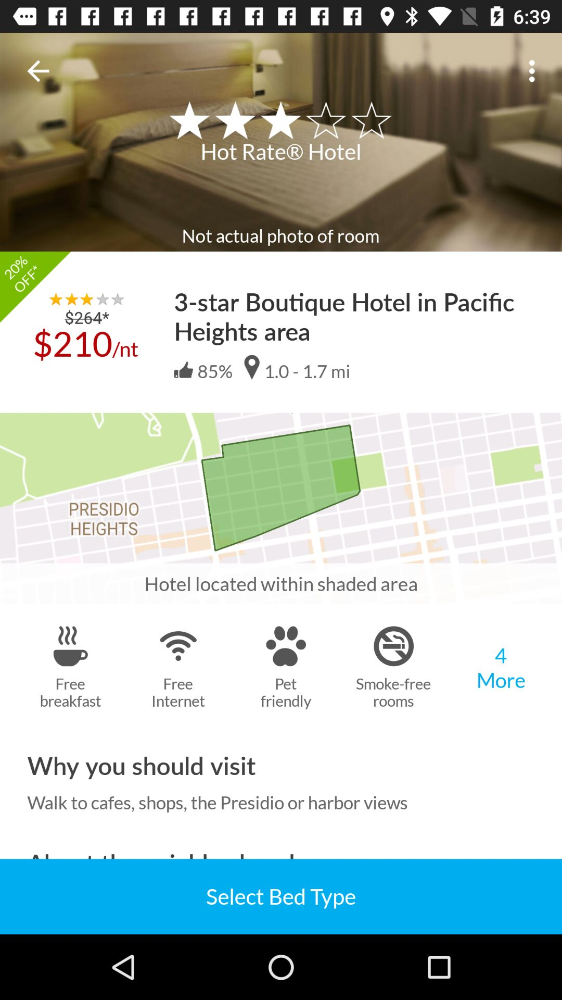

./datasets/filtered_traces/com.hotwire.hotels/trace_0/screenshots/227.jpg


method1


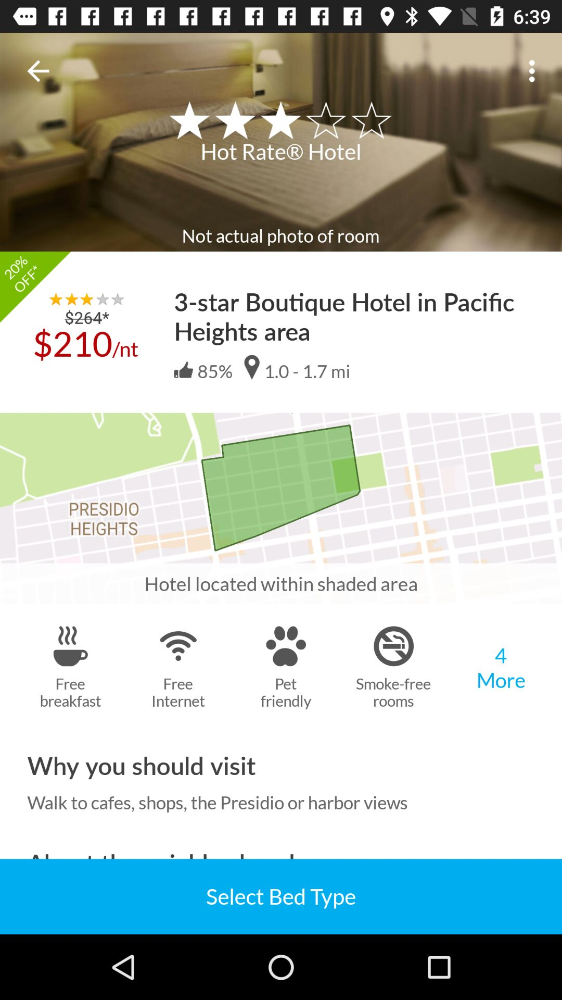

./datasets/filtered_traces/com.hotwire.hotels/trace_0/screenshots/227.jpg
com.hotwire.hotels
com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity
{"rico_id": "com.hotwire.hotels-trace_0-227", "package_name": "com.hotwire.hotels", "activity_name": "com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity"}
Similarity Score:  0.0


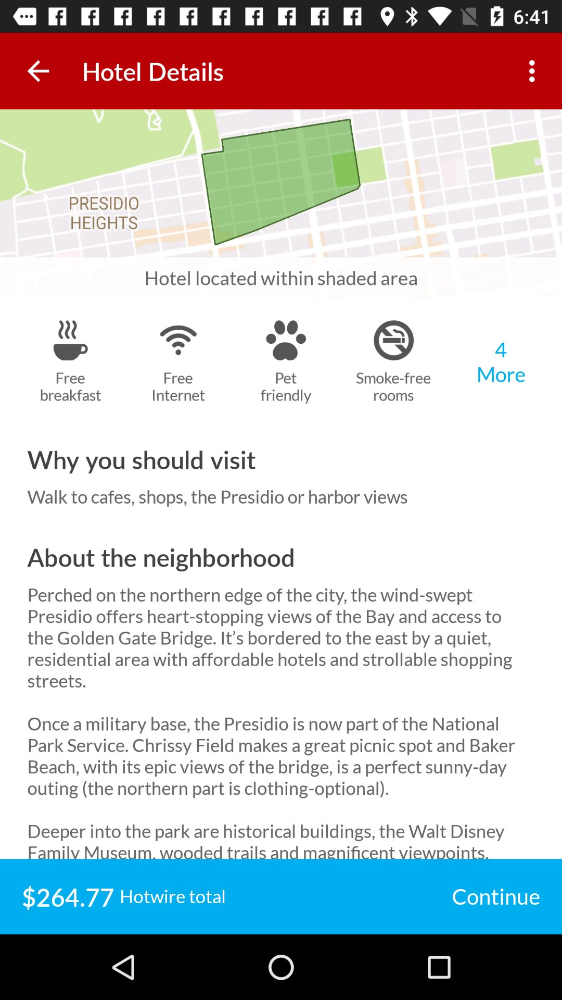

./datasets/filtered_traces/com.hotwire.hotels/trace_0/screenshots/300.jpg
com.hotwire.hotels
com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity
{"rico_id": "com.hotwire.hotels-trace_0-300", "package_name": "com.hotwire.hotels", "activity_name": "com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity"}
Similarity Score:  0.00037288064015250644


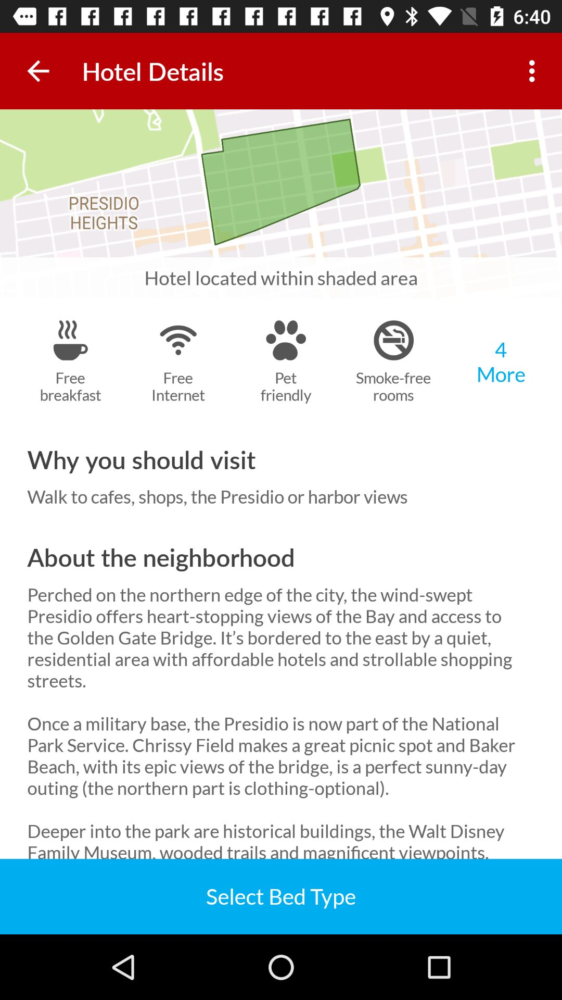

./datasets/filtered_traces/com.hotwire.hotels/trace_0/screenshots/276.jpg
com.hotwire.hotels
com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity
{"rico_id": "com.hotwire.hotels-trace_0-276", "package_name": "com.hotwire.hotels", "activity_name": "com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity"}
Similarity Score:  0.00037288064015250644


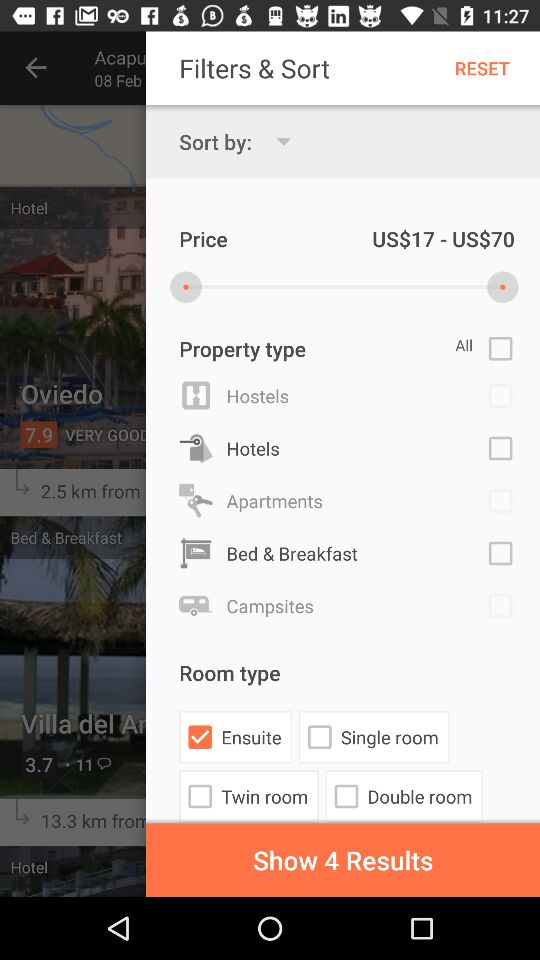

./datasets/filtered_traces/com.hostelworld.app/trace_0/screenshots/812.jpg
com.hostelworld.app
com.hostelworld.app/com.hostelworld.app.controller.ExploreActivity
{"rico_id": "com.hostelworld.app-trace_0-812", "package_name": "com.hostelworld.app", "activity_name": "com.hostelworld.app/com.hostelworld.app.controller.ExploreActivity"}
Similarity Score:  0.021677494828356347


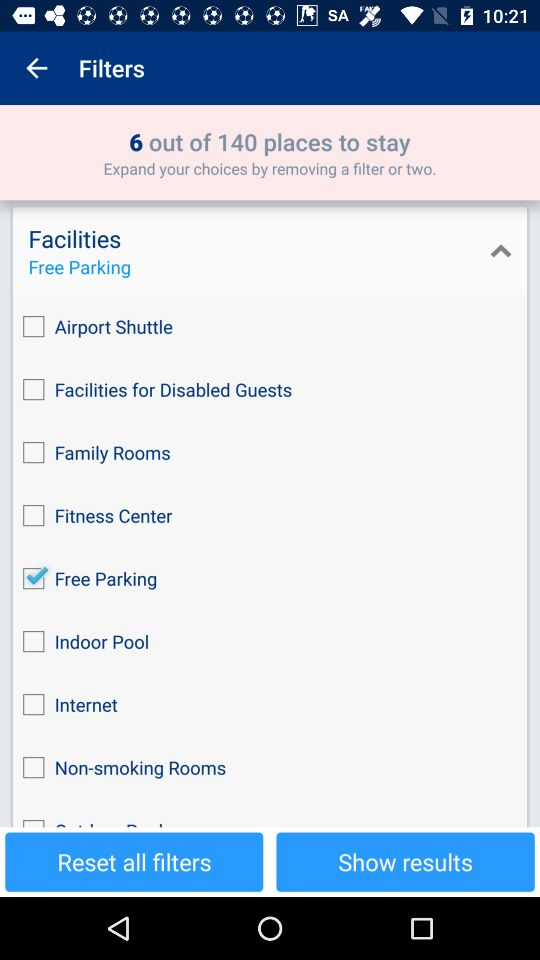

./datasets/filtered_traces/com.booking/trace_1/screenshots/1446.jpg
com.booking
com.booking/com.booking.activity.ServerFilterActivity
{"rico_id": "com.booking-trace_1-1446", "package_name": "com.booking", "activity_name": "com.booking/com.booking.activity.ServerFilterActivity"}
Similarity Score:  0.023500700328051294


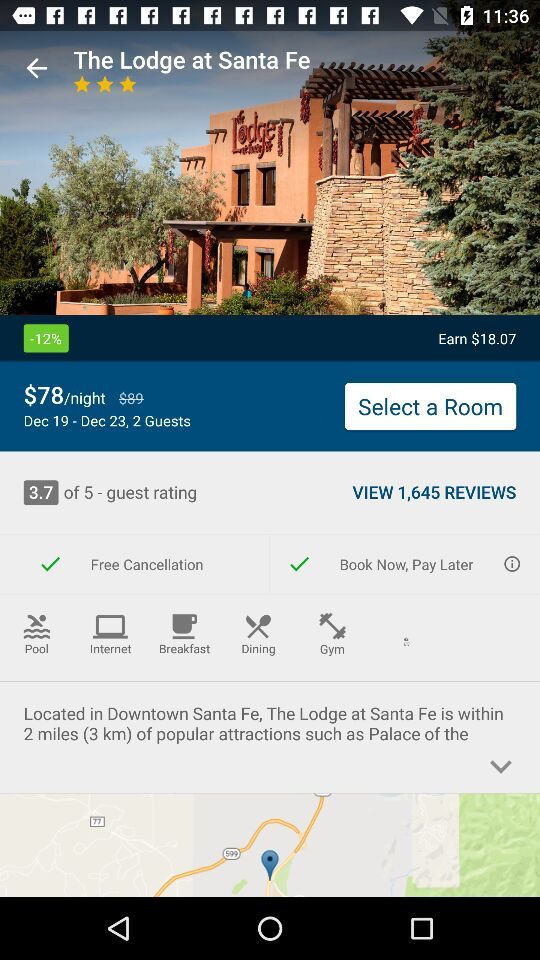

./datasets/filtered_traces/com.orbitz/trace_0/screenshots/1699.jpg
com.orbitz
com.orbitz/com.expedia.ui.HotelActivity
{"rico_id": "com.orbitz-trace_0-1699", "package_name": "com.orbitz", "activity_name": "com.orbitz/com.expedia.ui.HotelActivity"}
Similarity Score:  0.024991786836157104


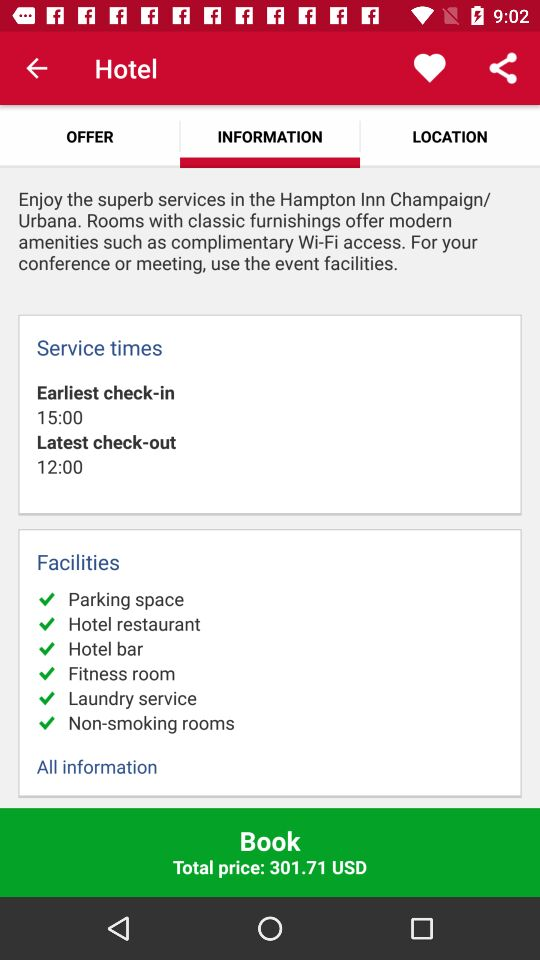

./datasets/filtered_traces/com.hrs.android/trace_0/screenshots/3348.jpg
com.hrs.android
com.hrs.android/com.hrs.android.hoteldetail.HotelDetailActivity
{"rico_id": "com.hrs.android-trace_0-3348", "package_name": "com.hrs.android", "activity_name": "com.hrs.android/com.hrs.android.hoteldetail.HotelDetailActivity"}
Similarity Score:  0.026585754823118757


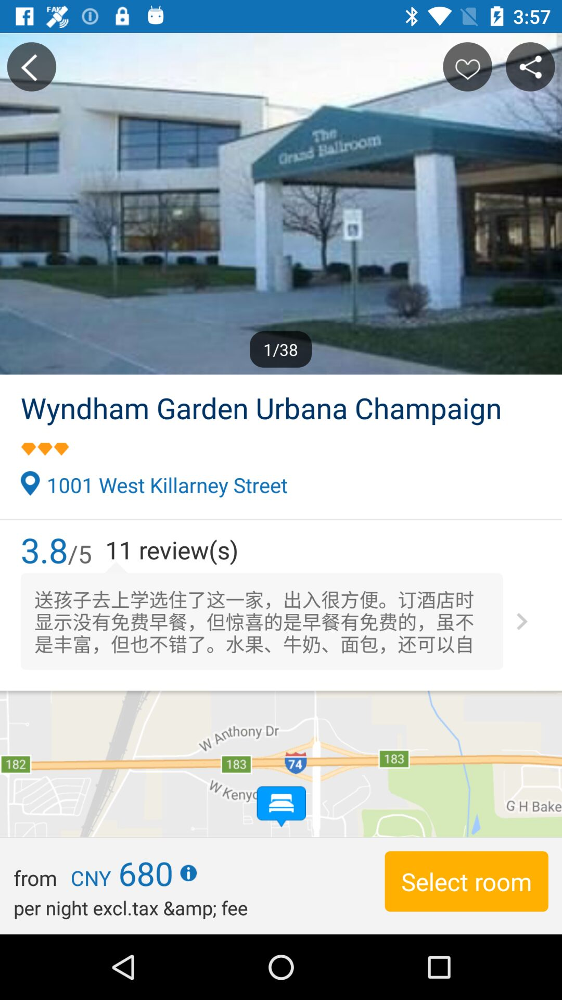

./datasets/filtered_traces/ctrip.english/trace_0/screenshots/385.jpg
ctrip.english
ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity
{"rico_id": "ctrip.english-trace_0-385", "package_name": "ctrip.english", "activity_name": "ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity"}
Similarity Score:  0.028513517282703127


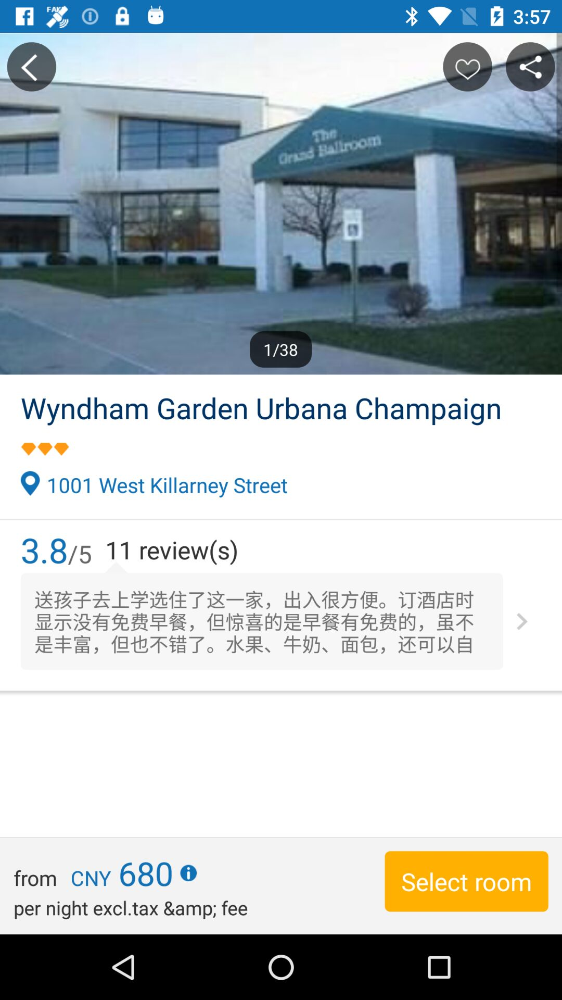

./datasets/filtered_traces/ctrip.english/trace_0/screenshots/358.jpg
ctrip.english
ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity
{"rico_id": "ctrip.english-trace_0-358", "package_name": "ctrip.english", "activity_name": "ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity"}
Similarity Score:  0.028513517282703127


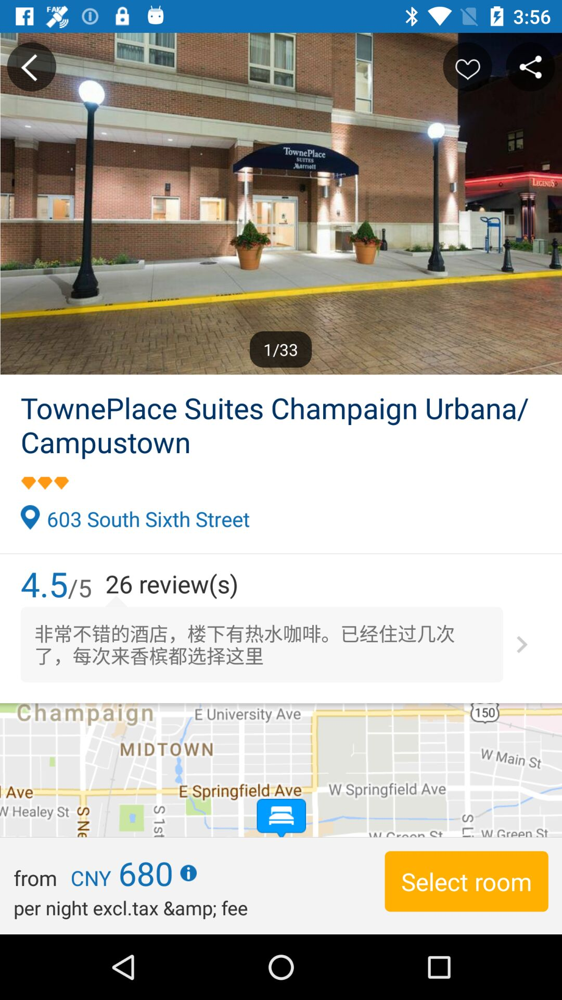

./datasets/filtered_traces/ctrip.english/trace_0/screenshots/146.jpg
ctrip.english
ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity
{"rico_id": "ctrip.english-trace_0-146", "package_name": "ctrip.english", "activity_name": "ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity"}
Similarity Score:  0.028766750400163077


method2a


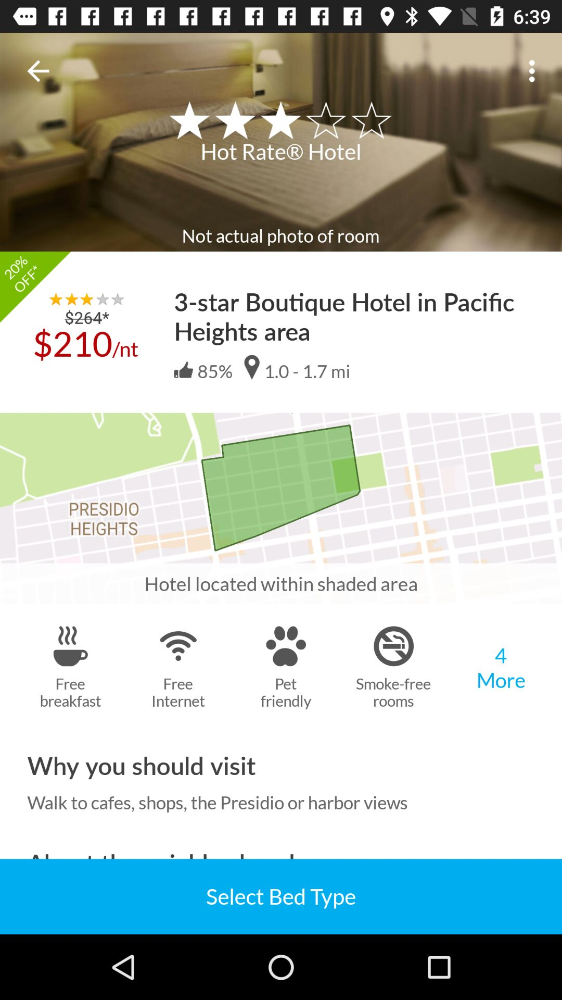

./datasets/filtered_traces/com.hotwire.hotels/trace_0/screenshots/227.jpg
com.hotwire.hotels
com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity
{"rico_id": "com.hotwire.hotels-trace_0-227", "package_name": "com.hotwire.hotels", "activity_name": "com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity"}
Similarity Score:  0.0


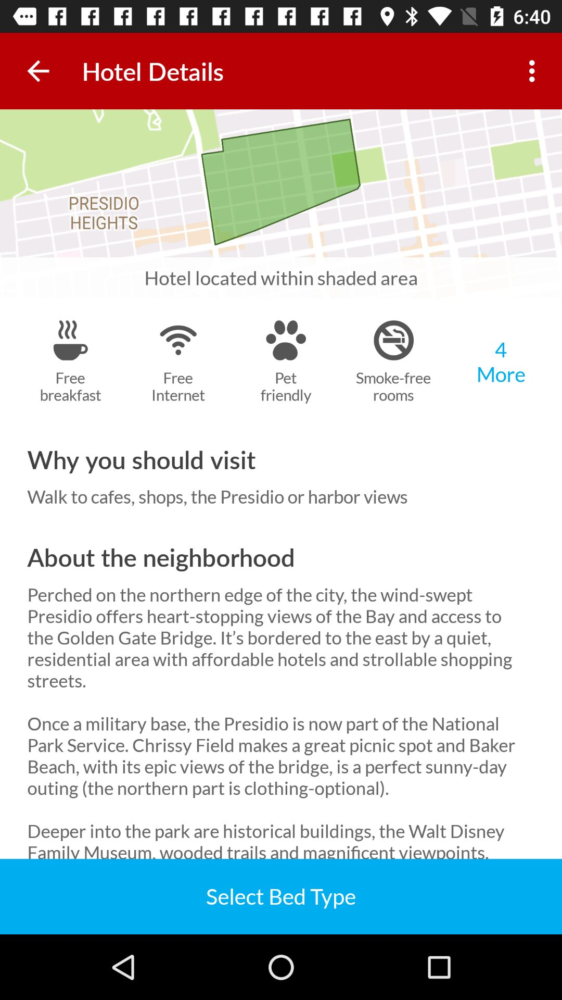

./datasets/filtered_traces/com.hotwire.hotels/trace_0/screenshots/276.jpg
com.hotwire.hotels
com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity
{"rico_id": "com.hotwire.hotels-trace_0-276", "package_name": "com.hotwire.hotels", "activity_name": "com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity"}
Similarity Score:  4.992967028383255e-06


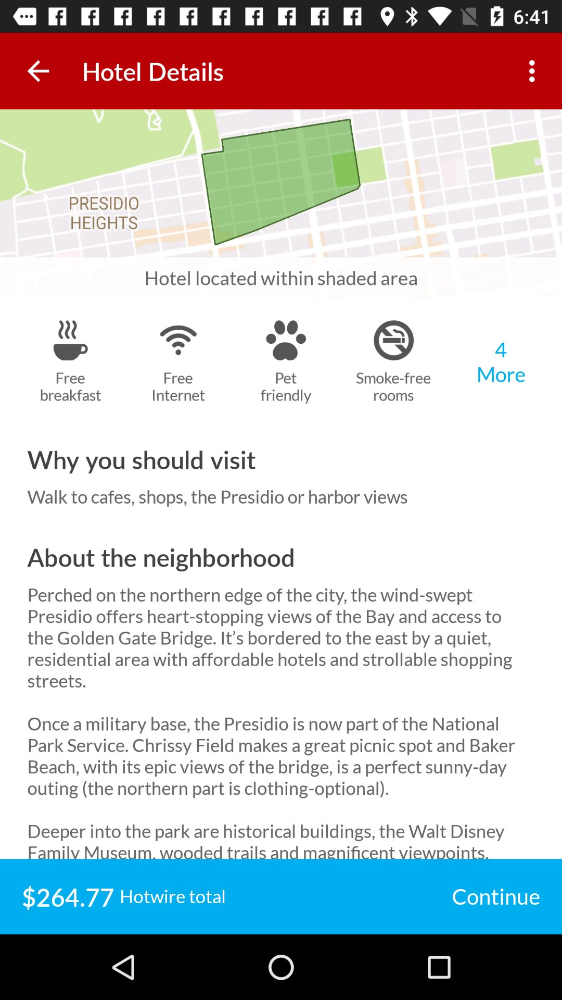

./datasets/filtered_traces/com.hotwire.hotels/trace_0/screenshots/300.jpg
com.hotwire.hotels
com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity
{"rico_id": "com.hotwire.hotels-trace_0-300", "package_name": "com.hotwire.hotels", "activity_name": "com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity"}
Similarity Score:  4.992967028383255e-06


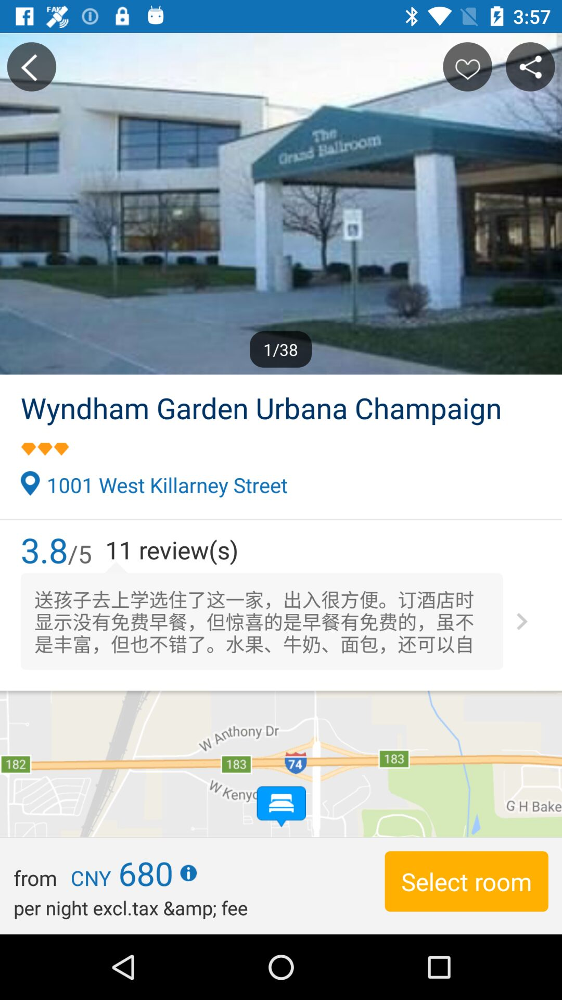

./datasets/filtered_traces/ctrip.english/trace_0/screenshots/385.jpg
ctrip.english
ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity
{"rico_id": "ctrip.english-trace_0-385", "package_name": "ctrip.english", "activity_name": "ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity"}
Similarity Score:  0.0018440005987193642


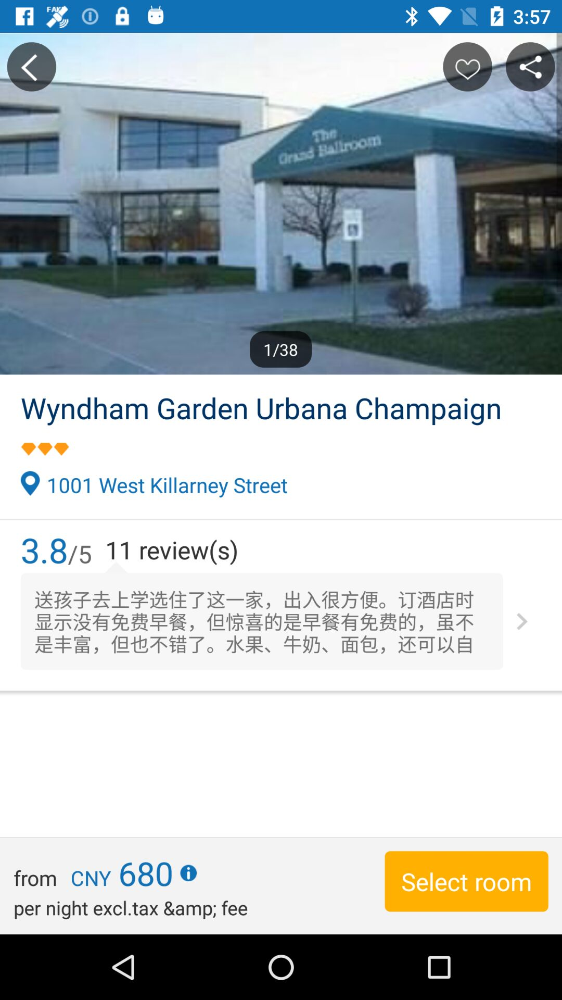

./datasets/filtered_traces/ctrip.english/trace_0/screenshots/358.jpg
ctrip.english
ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity
{"rico_id": "ctrip.english-trace_0-358", "package_name": "ctrip.english", "activity_name": "ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity"}
Similarity Score:  0.0018440005987193642


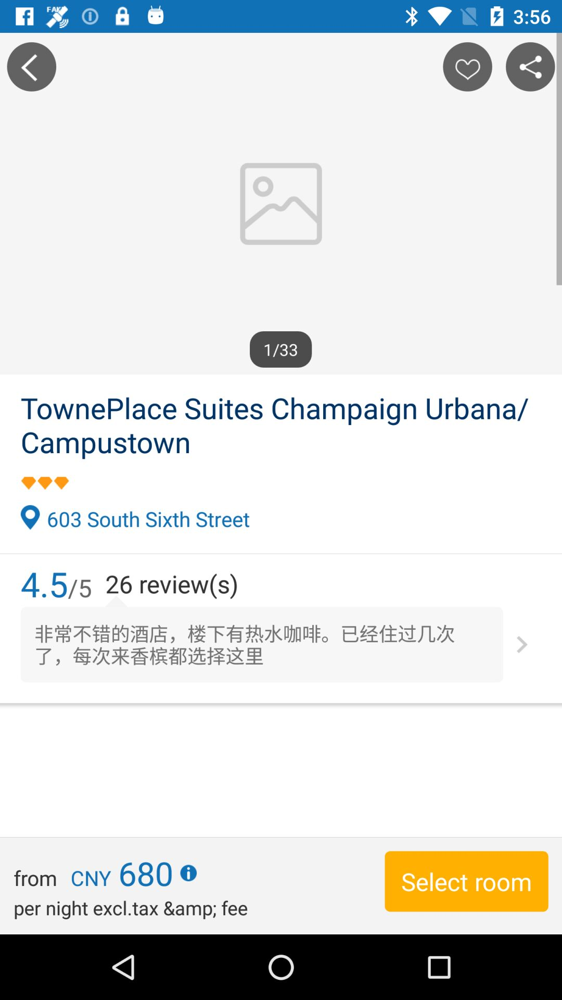

./datasets/filtered_traces/ctrip.english/trace_0/screenshots/127.jpg
ctrip.english
ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity
{"rico_id": "ctrip.english-trace_0-127", "package_name": "ctrip.english", "activity_name": "ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity"}
Similarity Score:  0.001935788397399274


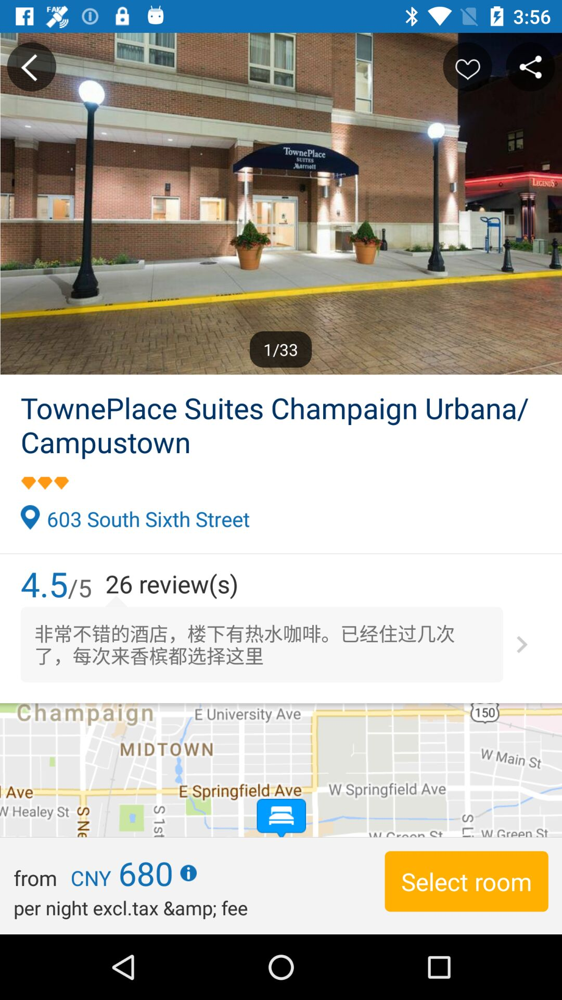

./datasets/filtered_traces/ctrip.english/trace_0/screenshots/146.jpg
ctrip.english
ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity
{"rico_id": "ctrip.english-trace_0-146", "package_name": "ctrip.english", "activity_name": "ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity"}
Similarity Score:  0.001935788397399274


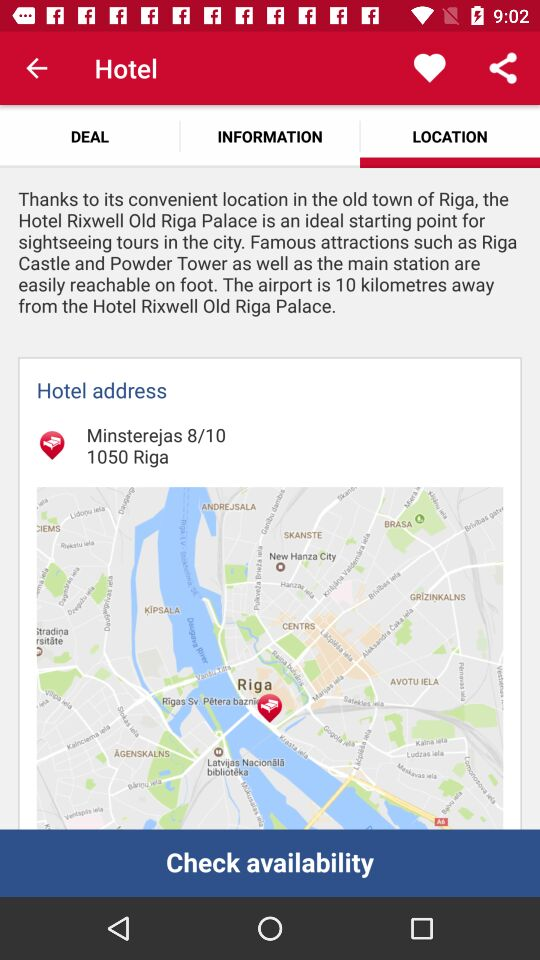

./datasets/filtered_traces/com.hrs.android/trace_0/screenshots/4070.jpg
com.hrs.android
com.hrs.android/com.hrs.android.hoteldetail.HotelDetailActivity
{"rico_id": "com.hrs.android-trace_0-4070", "package_name": "com.hrs.android", "activity_name": "com.hrs.android/com.hrs.android.hoteldetail.HotelDetailActivity"}
Similarity Score:  0.002123119043004218


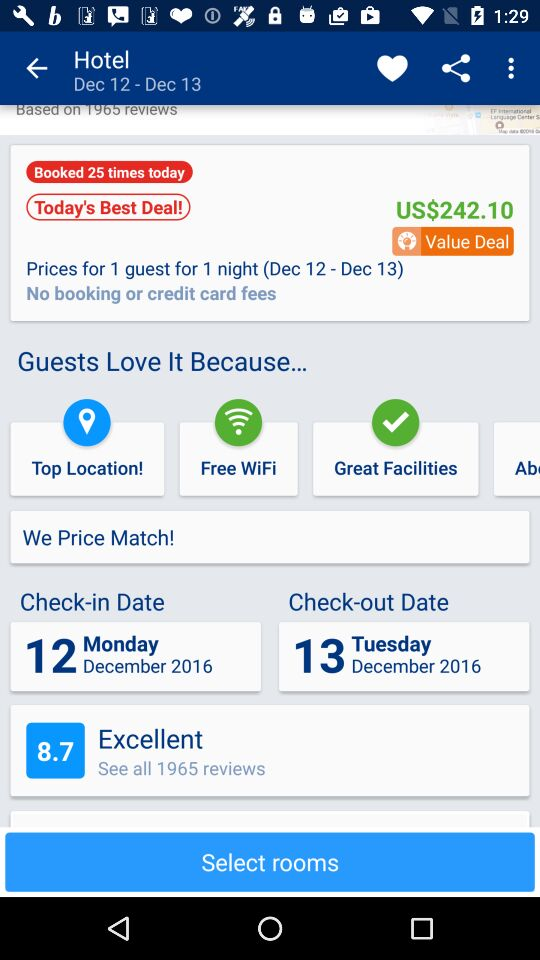

./datasets/filtered_traces/com.booking/trace_0/screenshots/1660.jpg
com.booking
com.booking/com.booking.activity.HotelActivity
{"rico_id": "com.booking-trace_0-1660", "package_name": "com.booking", "activity_name": "com.booking/com.booking.activity.HotelActivity"}
Similarity Score:  0.0021656056718811767


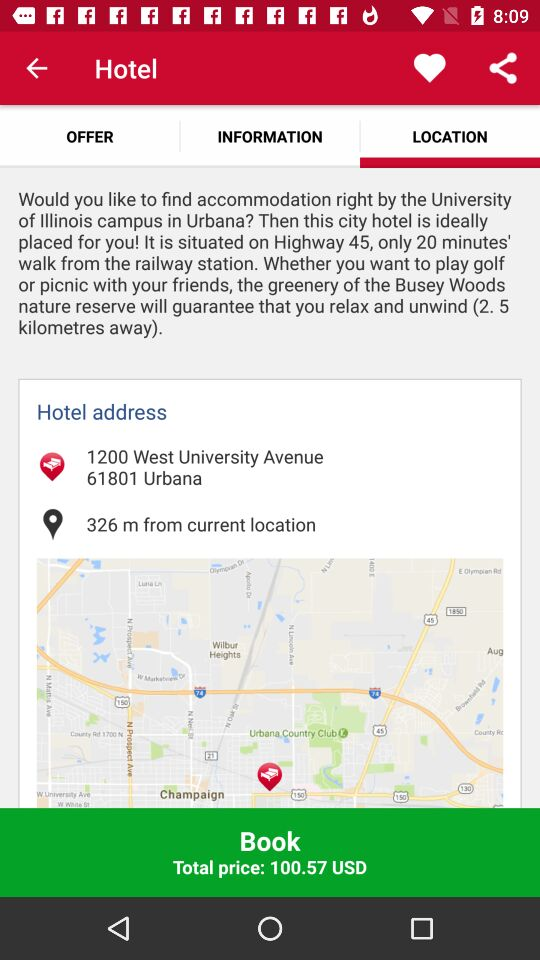

./datasets/filtered_traces/com.hrs.b2c.android/trace_0/screenshots/1355.jpg
com.hrs.b2c.android
com.hrs.b2c.android/com.hrs.android.hoteldetail.HotelDetailActivity
{"rico_id": "com.hrs.b2c.android-trace_0-1355", "package_name": "com.hrs.b2c.android", "activity_name": "com.hrs.b2c.android/com.hrs.android.hoteldetail.HotelDetailActivity"}
Similarity Score:  0.0024316357378139086


method2b


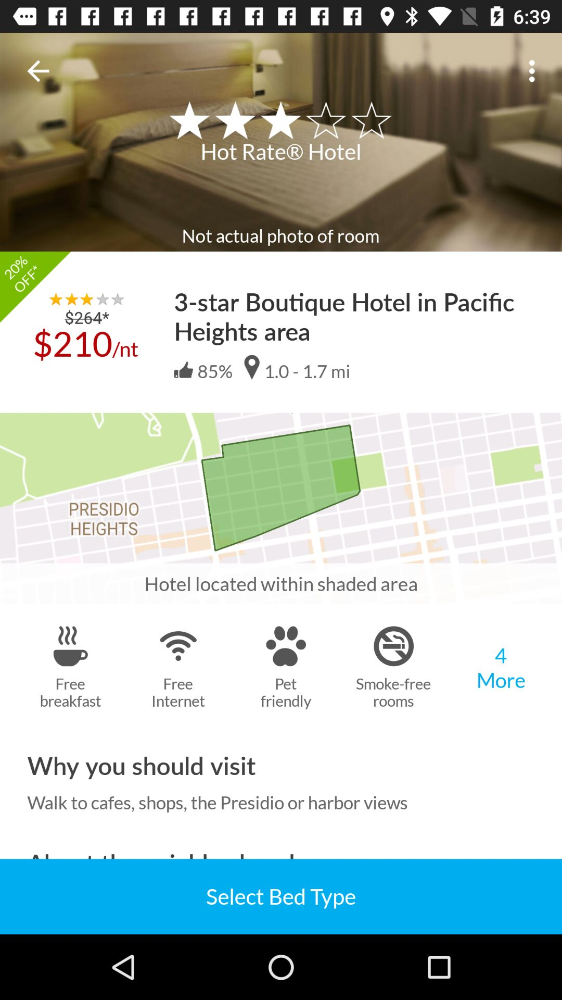

./datasets/filtered_traces/com.hotwire.hotels/trace_0/screenshots/227.jpg
com.hotwire.hotels
com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity
{"rico_id": "com.hotwire.hotels-trace_0-227", "package_name": "com.hotwire.hotels", "activity_name": "com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity"}
Similarity Score:  0.0


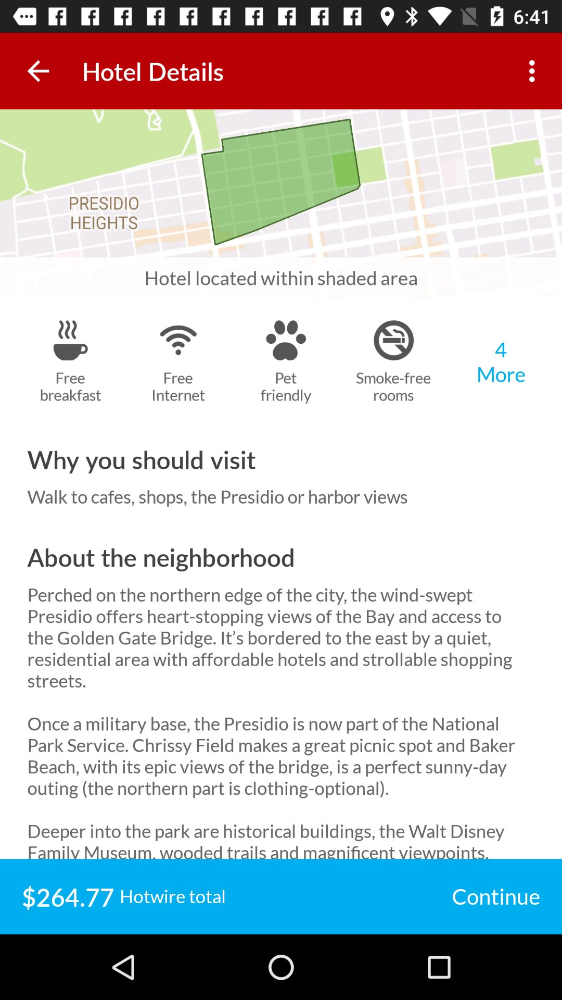

./datasets/filtered_traces/com.hotwire.hotels/trace_0/screenshots/300.jpg
com.hotwire.hotels
com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity
{"rico_id": "com.hotwire.hotels-trace_0-300", "package_name": "com.hotwire.hotels", "activity_name": "com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity"}
Similarity Score:  4.770418556188094e-05


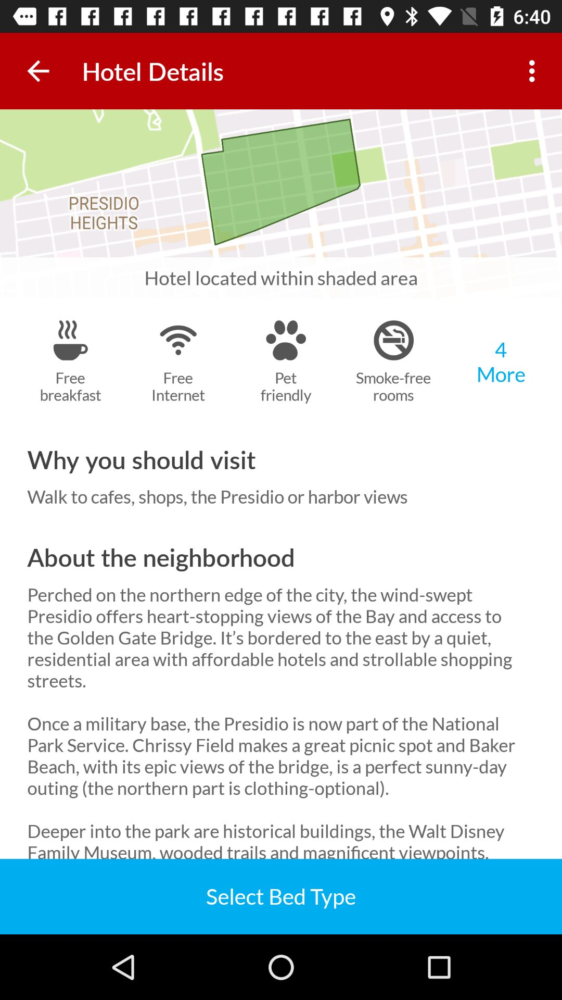

./datasets/filtered_traces/com.hotwire.hotels/trace_0/screenshots/276.jpg
com.hotwire.hotels
com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity
{"rico_id": "com.hotwire.hotels-trace_0-276", "package_name": "com.hotwire.hotels", "activity_name": "com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity"}
Similarity Score:  4.770418556188094e-05


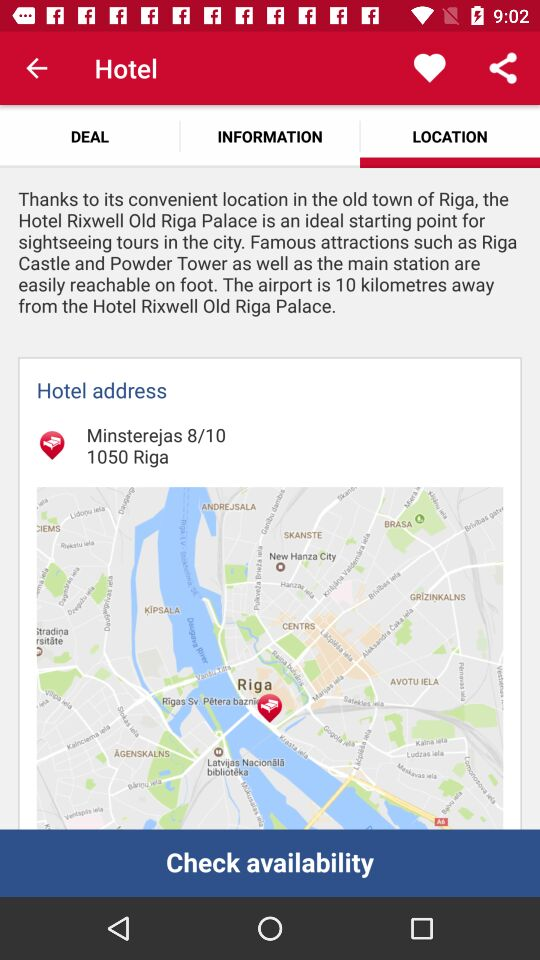

./datasets/filtered_traces/com.hrs.android/trace_0/screenshots/4070.jpg
com.hrs.android
com.hrs.android/com.hrs.android.hoteldetail.HotelDetailActivity
{"rico_id": "com.hrs.android-trace_0-4070", "package_name": "com.hrs.android", "activity_name": "com.hrs.android/com.hrs.android.hoteldetail.HotelDetailActivity"}
Similarity Score:  0.018765823425376027


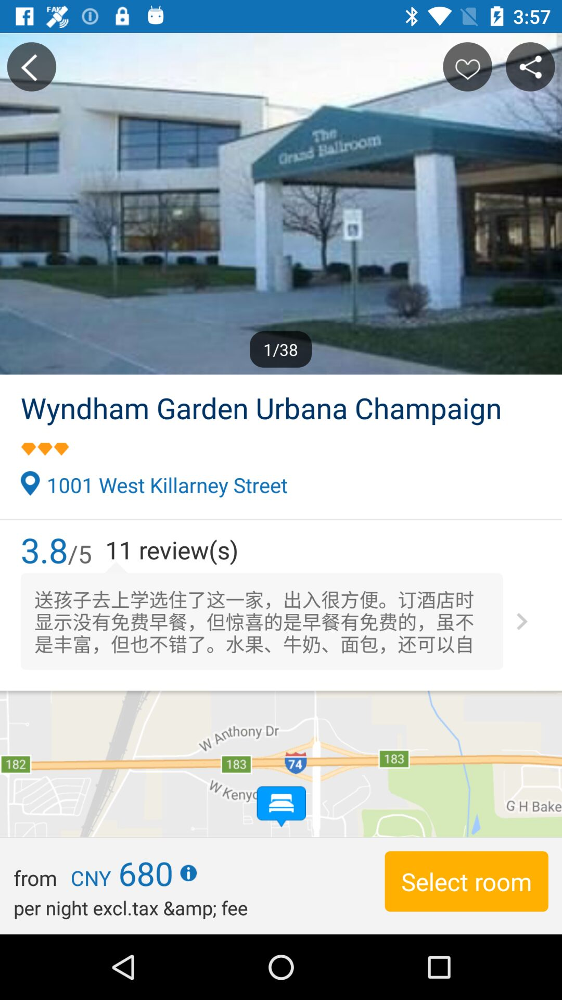

./datasets/filtered_traces/ctrip.english/trace_0/screenshots/385.jpg
ctrip.english
ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity
{"rico_id": "ctrip.english-trace_0-385", "package_name": "ctrip.english", "activity_name": "ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity"}
Similarity Score:  0.023958476421458985


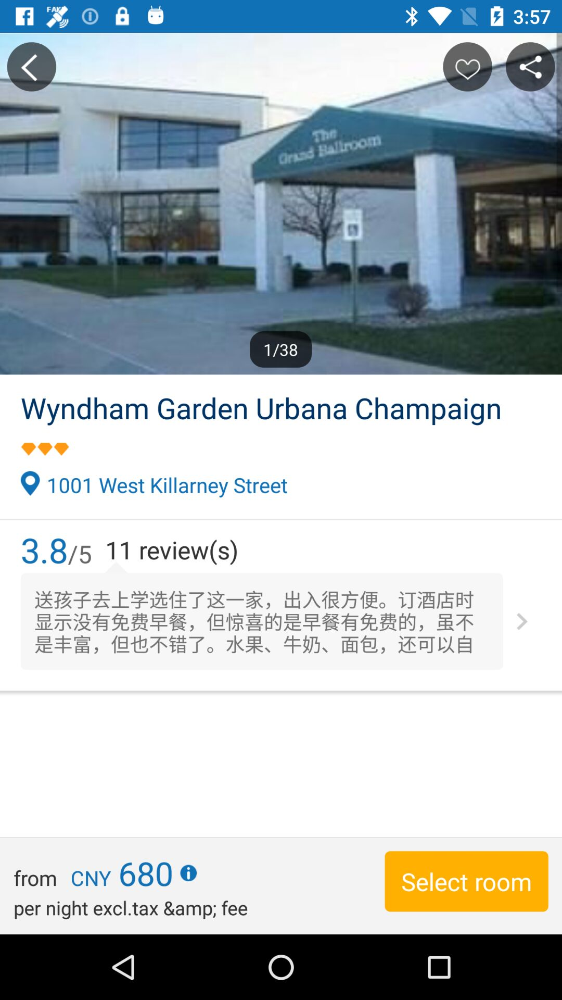

./datasets/filtered_traces/ctrip.english/trace_0/screenshots/358.jpg
ctrip.english
ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity
{"rico_id": "ctrip.english-trace_0-358", "package_name": "ctrip.english", "activity_name": "ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity"}
Similarity Score:  0.023958476421458985


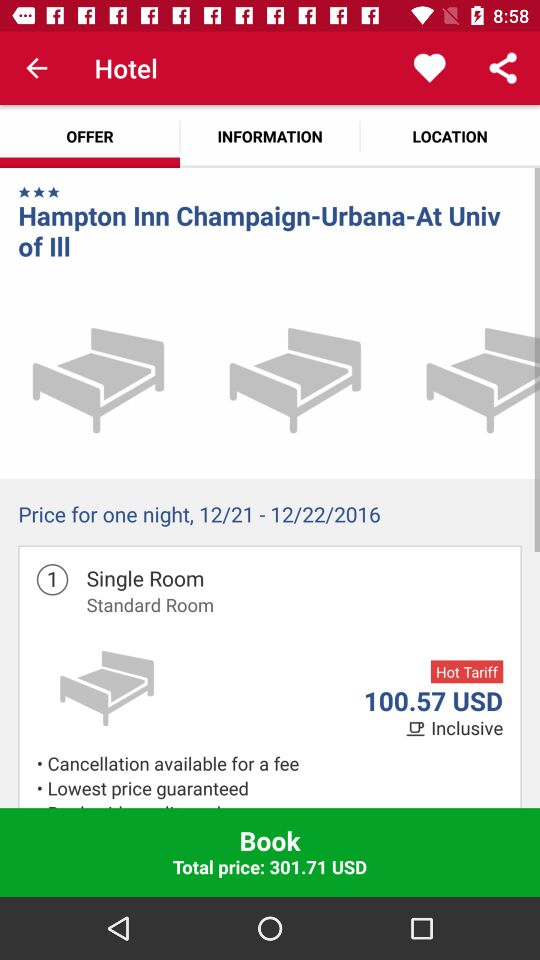

./datasets/filtered_traces/com.hrs.android/trace_0/screenshots/1574.jpg
com.hrs.android
com.hrs.android/com.hrs.android.hoteldetail.HotelDetailActivity
{"rico_id": "com.hrs.android-trace_0-1574", "package_name": "com.hrs.android", "activity_name": "com.hrs.android/com.hrs.android.hoteldetail.HotelDetailActivity"}
Similarity Score:  0.02471494390279494


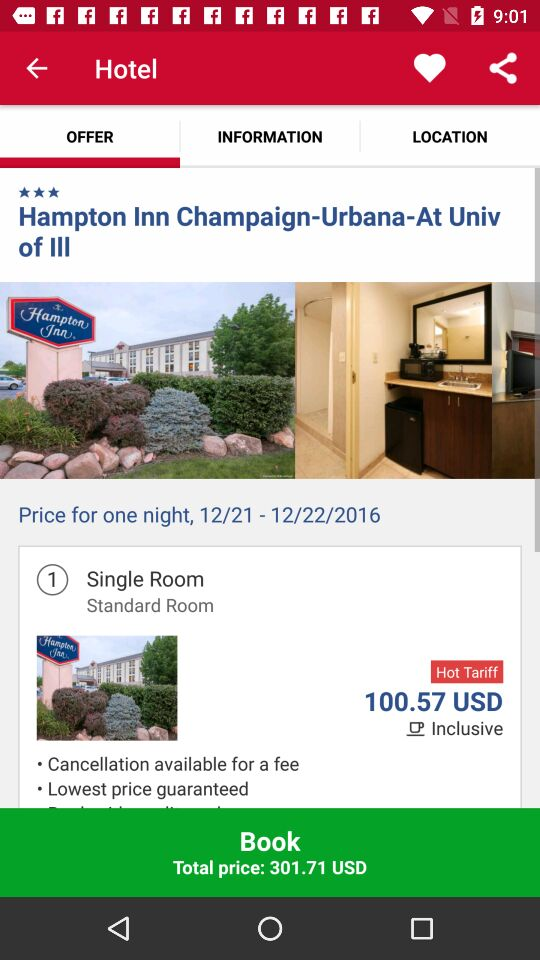

./datasets/filtered_traces/com.hrs.android/trace_0/screenshots/3034.jpg
com.hrs.android
com.hrs.android/com.hrs.android.hoteldetail.HotelDetailActivity
{"rico_id": "com.hrs.android-trace_0-3034", "package_name": "com.hrs.android", "activity_name": "com.hrs.android/com.hrs.android.hoteldetail.HotelDetailActivity"}
Similarity Score:  0.02471494390279494


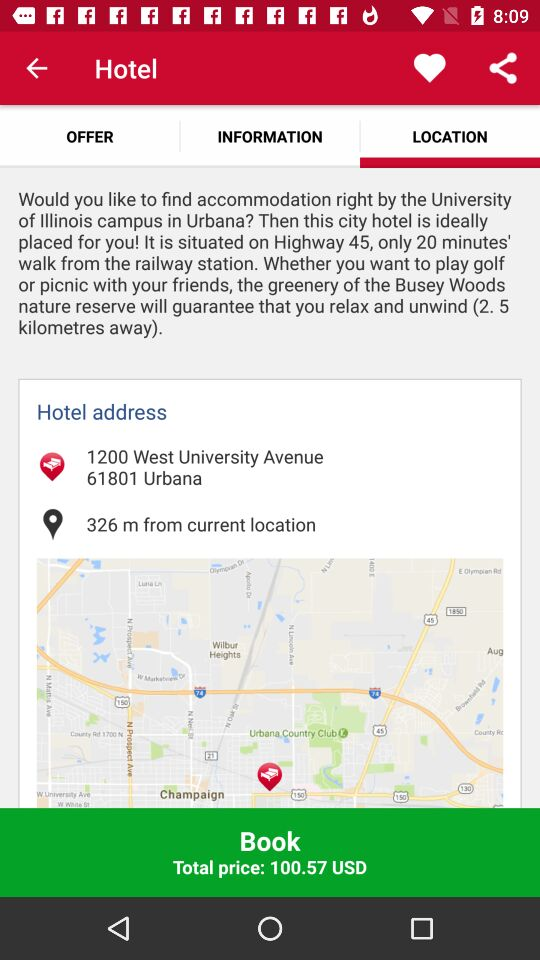

./datasets/filtered_traces/com.hrs.b2c.android/trace_0/screenshots/1355.jpg
com.hrs.b2c.android
com.hrs.b2c.android/com.hrs.android.hoteldetail.HotelDetailActivity
{"rico_id": "com.hrs.b2c.android-trace_0-1355", "package_name": "com.hrs.b2c.android", "activity_name": "com.hrs.b2c.android/com.hrs.android.hoteldetail.HotelDetailActivity"}
Similarity Score:  0.025320902512808274


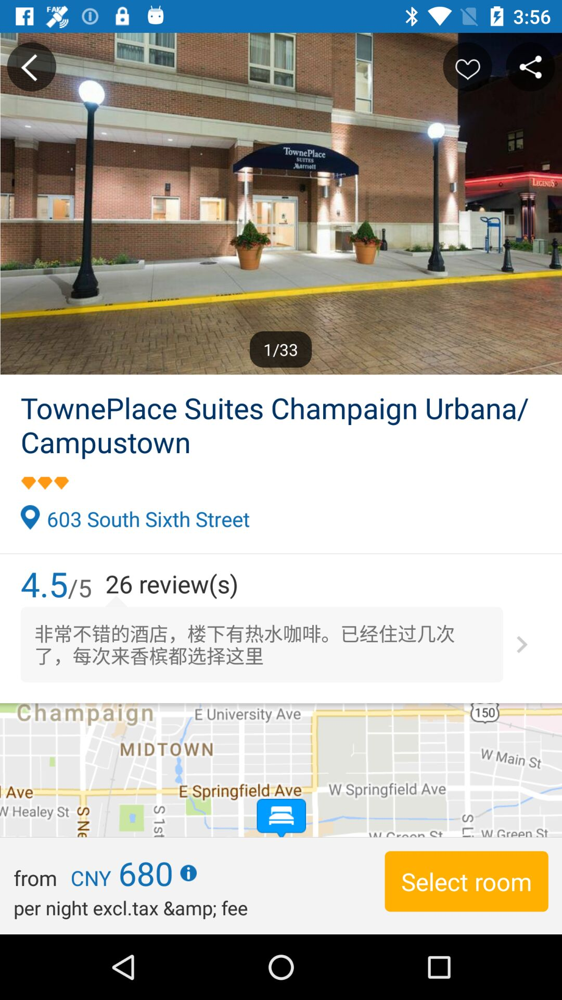

./datasets/filtered_traces/ctrip.english/trace_0/screenshots/146.jpg
ctrip.english
ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity
{"rico_id": "ctrip.english-trace_0-146", "package_name": "ctrip.english", "activity_name": "ctrip.english/ctrip.english.hotel.module.detail.HotelDetailActivity"}
Similarity Score:  0.02656641174212604


method3


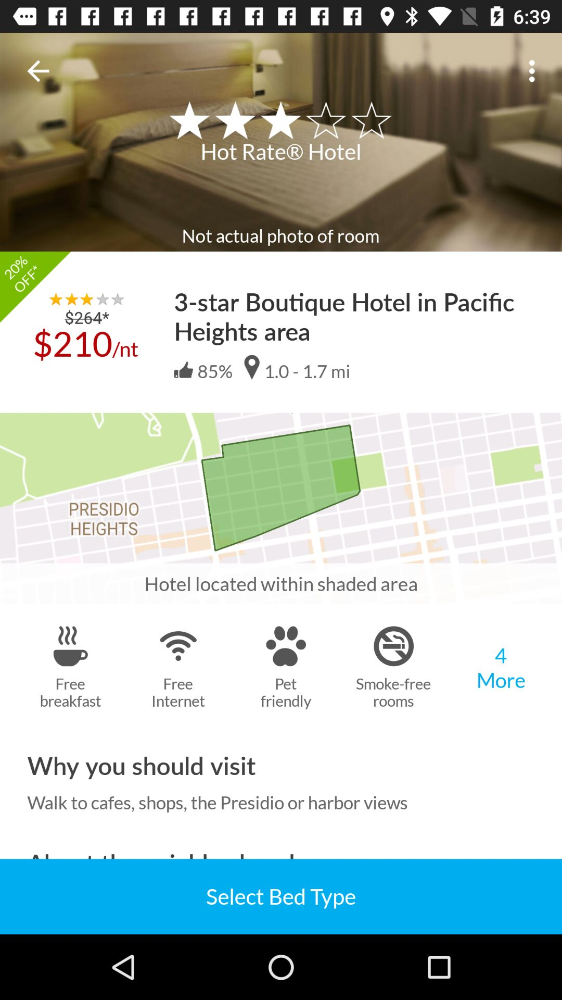

./datasets/filtered_traces/com.hotwire.hotels/trace_0/screenshots/227.jpg
com.hotwire.hotels
com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity
{"rico_id": "com.hotwire.hotels-trace_0-227", "package_name": "com.hotwire.hotels", "activity_name": "com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity"}
Similarity Score:  0.0


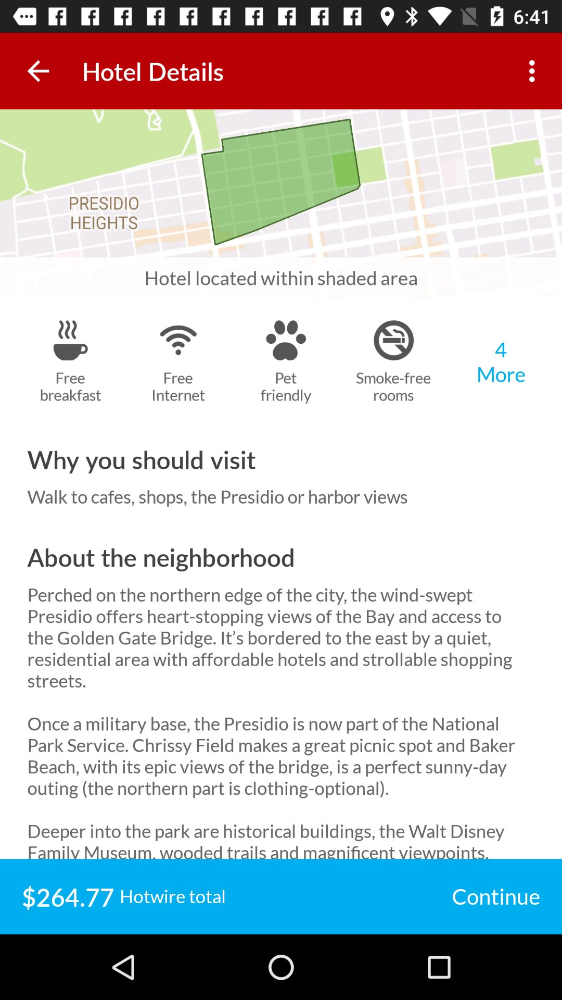

./datasets/filtered_traces/com.hotwire.hotels/trace_0/screenshots/300.jpg
com.hotwire.hotels
com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity
{"rico_id": "com.hotwire.hotels-trace_0-300", "package_name": "com.hotwire.hotels", "activity_name": "com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity"}
Similarity Score:  0.0011232603664723673


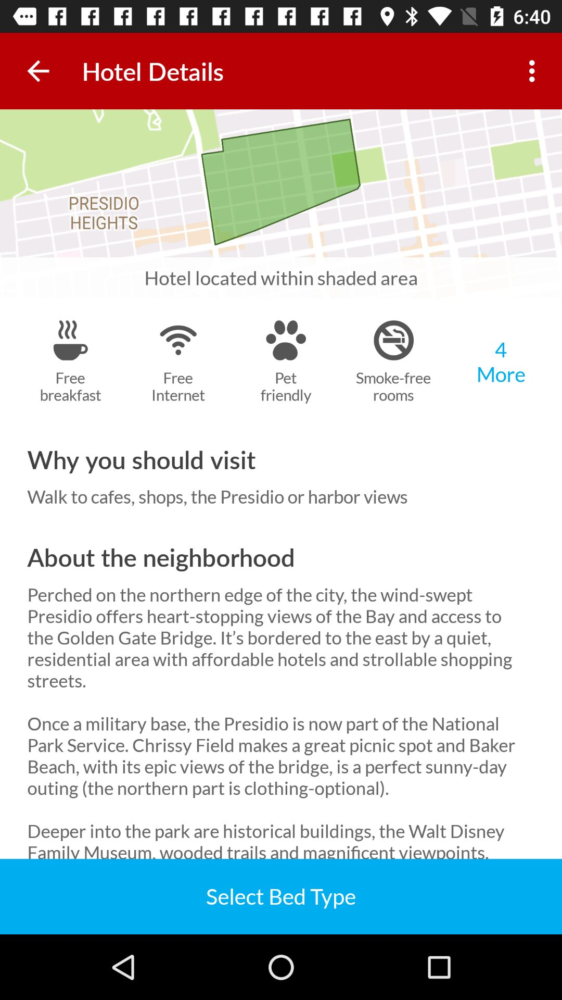

./datasets/filtered_traces/com.hotwire.hotels/trace_0/screenshots/276.jpg
com.hotwire.hotels
com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity
{"rico_id": "com.hotwire.hotels-trace_0-276", "package_name": "com.hotwire.hotels", "activity_name": "com.hotwire.hotels/com.hotwire.hotels.details.activity.HotelDetailsMixedModeActivity"}
Similarity Score:  0.0011232603664723673


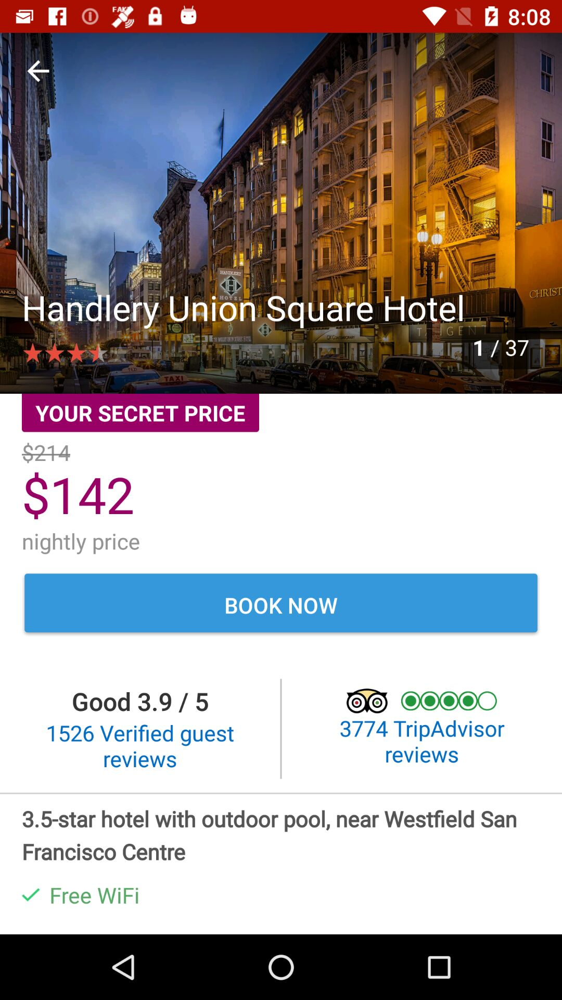

./datasets/filtered_traces/com.hcom.android/trace_0/screenshots/302.jpg
com.hcom.android
com.hcom.android/com.hcom.android.modules.hotel.details.presenter.PropertyDetailsPageActivity
{"rico_id": "com.hcom.android-trace_0-302", "package_name": "com.hcom.android", "activity_name": "com.hcom.android/com.hcom.android.modules.hotel.details.presenter.PropertyDetailsPageActivity"}
Similarity Score:  0.12464956043747888


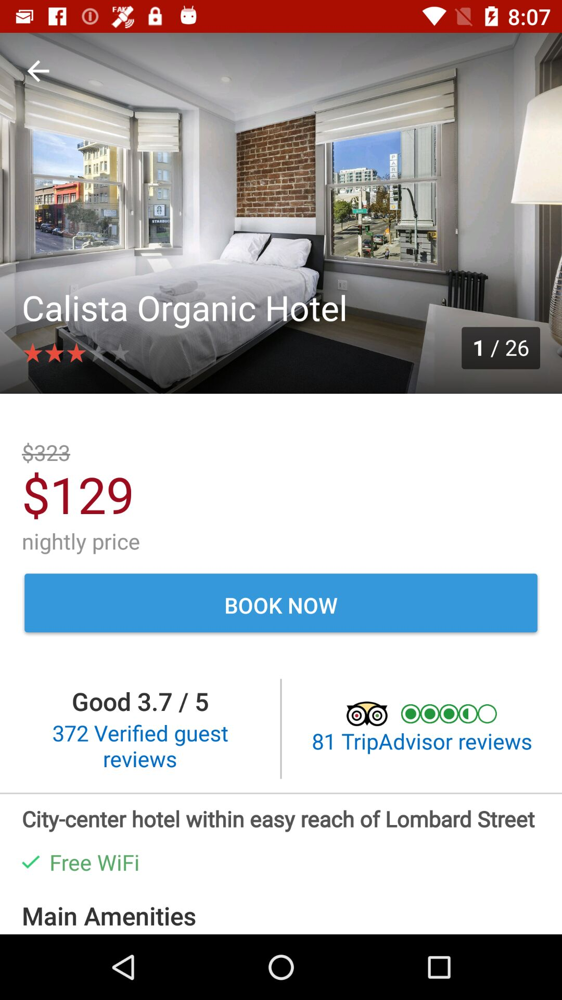

./datasets/filtered_traces/com.hcom.android/trace_0/screenshots/110.jpg
com.hcom.android
com.hcom.android/com.hcom.android.modules.hotel.details.presenter.PropertyDetailsPageActivity
{"rico_id": "com.hcom.android-trace_0-110", "package_name": "com.hcom.android", "activity_name": "com.hcom.android/com.hcom.android.modules.hotel.details.presenter.PropertyDetailsPageActivity"}
Similarity Score:  0.13081438829176906


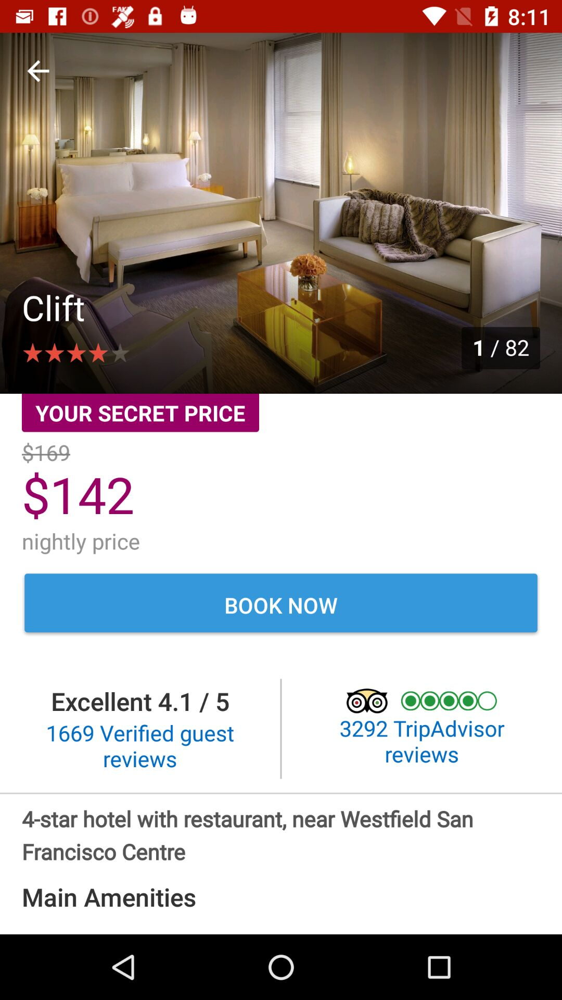

./datasets/filtered_traces/com.hcom.android/trace_0/screenshots/384.jpg
com.hcom.android
com.hcom.android/com.hcom.android.modules.hotel.details.presenter.PropertyDetailsPageActivity
{"rico_id": "com.hcom.android-trace_0-384", "package_name": "com.hcom.android", "activity_name": "com.hcom.android/com.hcom.android.modules.hotel.details.presenter.PropertyDetailsPageActivity"}
Similarity Score:  0.13613161008196661


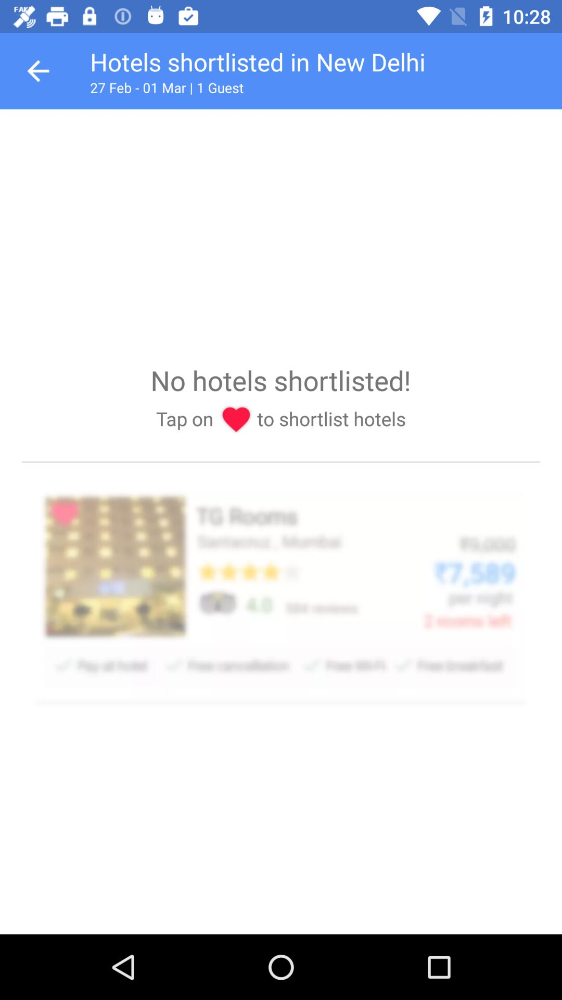

./datasets/filtered_traces/com.yatra.base/trace_2/screenshots/350.jpg
com.yatra.base
com.yatra.base/com.yatra.hotels.activity.HotelSearchResultsActivity
{"rico_id": "com.yatra.base-trace_2-350", "package_name": "com.yatra.base", "activity_name": "com.yatra.base/com.yatra.hotels.activity.HotelSearchResultsActivity"}
Similarity Score:  0.14673268745706514


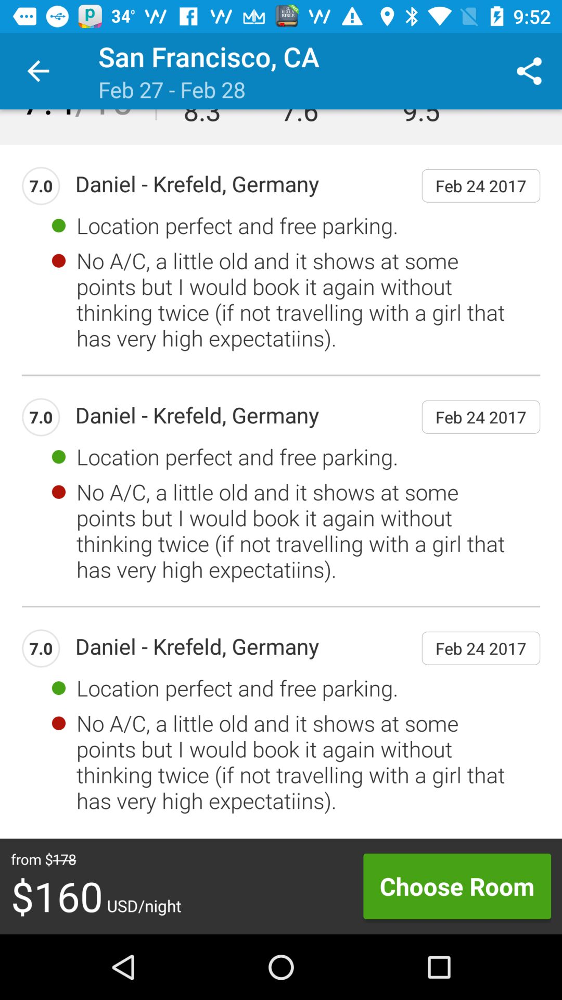

./datasets/filtered_traces/com.priceline.android.negotiator/trace_0/screenshots/292.jpg
com.priceline.android.negotiator
com.priceline.android.negotiator/com.priceline.android.negotiator.stay.retail.ui.activities.StayRetailDetailsActivity
{"rico_id": "com.priceline.android.negotiator-trace_0-292", "package_name": "com.priceline.android.negotiator", "activity_name": "com.priceline.android.negotiator/com.priceline.android.negotiator.stay.retail.ui.activities.StayRetailDetailsActivity"}
Similarity Score:  0.1498243633066768


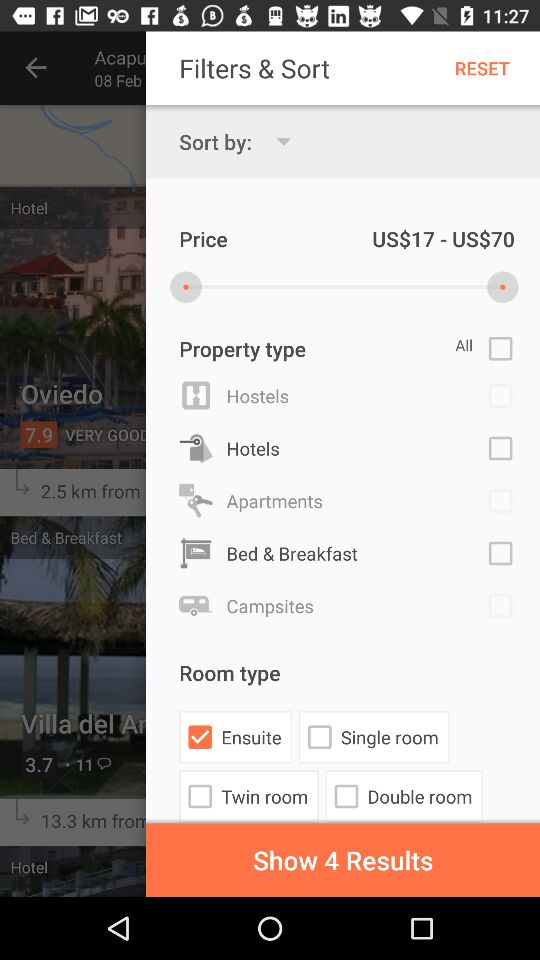

./datasets/filtered_traces/com.hostelworld.app/trace_0/screenshots/812.jpg
com.hostelworld.app
com.hostelworld.app/com.hostelworld.app.controller.ExploreActivity
{"rico_id": "com.hostelworld.app-trace_0-812", "package_name": "com.hostelworld.app", "activity_name": "com.hostelworld.app/com.hostelworld.app.controller.ExploreActivity"}
Similarity Score:  0.15072225434567554


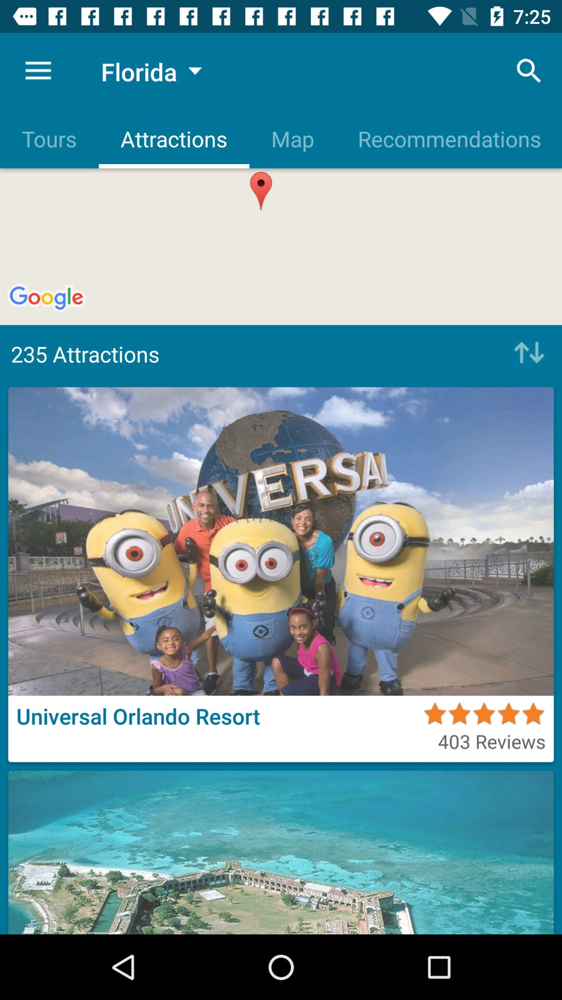

./datasets/filtered_traces/com.viator.mobile.android/trace_0/screenshots/213.jpg
com.viator.mobile.android
com.viator.mobile.android/com.viator.mobile.android.ui.phone.MainActivity
{"rico_id": "com.viator.mobile.android-trace_0-213", "package_name": "com.viator.mobile.android", "activity_name": "com.viator.mobile.android/com.viator.mobile.android.ui.phone.MainActivity"}
Similarity Score:  0.15839162184038869




In [29]:
source_id = 'com.hotwire.hotels-trace_0-227'
print (len(method1_rico_screen_id_embedding_dict))

print("source")
show_rico_image(source_id)
print('\n')

print("method1")
for entry in get_most_relevant_embeddings_by_id(source_id, method1_rico_screen_id_embedding_dict, 10):
    display_rico_result(entry['rico_id'])
    print("Similarity Score: ", entry['score'])
print('\n')

print("method2a")
for entry in get_most_relevant_embeddings_by_id(source_id, method2a_rico_screen_id_embedding_dict, 10):
    display_rico_result(entry['rico_id'])
    print("Similarity Score: ", entry['score'])
print('\n')

print("method2b")
for entry in get_most_relevant_embeddings_by_id(source_id, method2b_rico_screen_id_embedding_dict, 10):
    display_rico_result(entry['rico_id'])
    print("Similarity Score: ", entry['score'])
print('\n')

print("method3")
for entry in get_most_relevant_embeddings_by_id(source_id, method3_rico_screen_id_embedding_dict, 10):
    display_rico_result(entry['rico_id'])
    print("Similarity Score: ", entry['score'])
print('\n')






Batches: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


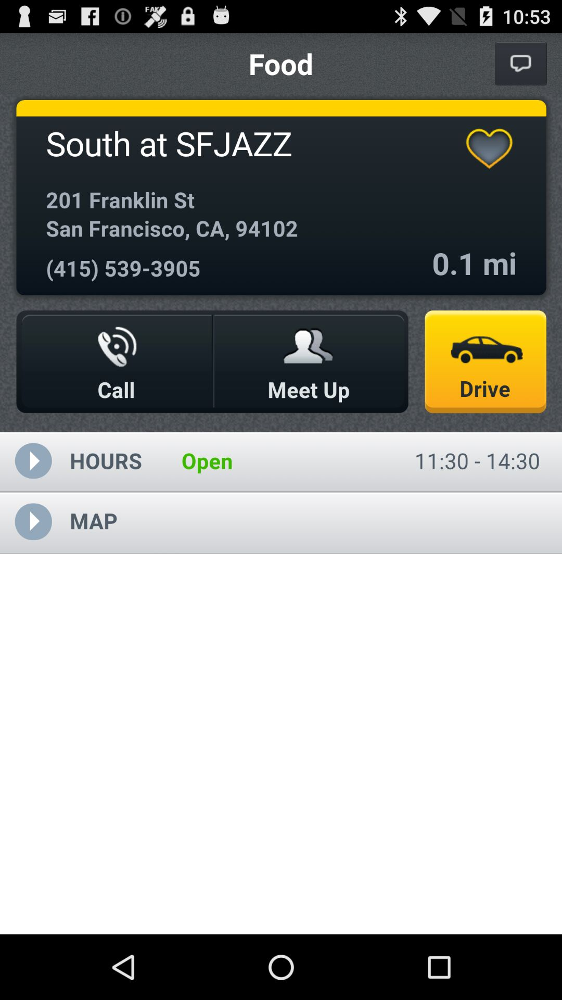

./datasets/filtered_traces/com.telenav.app.android.scout4cars/trace_0/screenshots/687.jpg
com.telenav.app.android.scout4cars
com.telenav.app.android.scout4cars/com.telenav.scout.module.place.detail.PlaceDetailActivity
{"rico_id": "com.telenav.app.android.scout4cars-trace_0-687", "package_name": "com.telenav.app.android.scout4cars", "activity_name": "com.telenav.app.android.scout4cars/com.telenav.scout.module.place.detail.PlaceDetailActivity"}
Similarity Score:  0.1259929468691734 



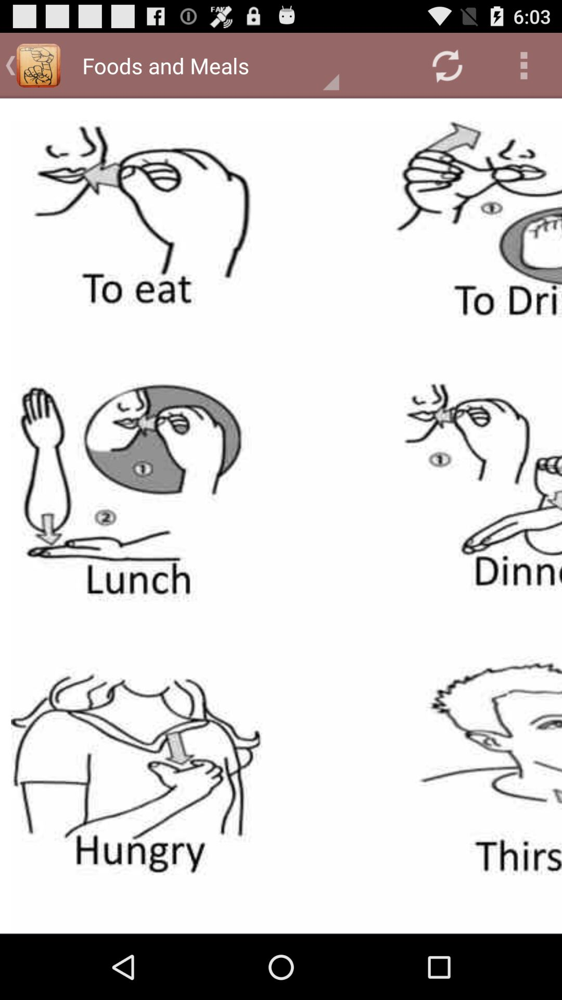

./datasets/filtered_traces/com.sign.language.learn1234/trace_0/screenshots/414.jpg
com.sign.language.learn1234
com.sign.language.learn1234/com.sign.language.learn1234.Custompage198474
{"rico_id": "com.sign.language.learn1234-trace_0-414", "package_name": "com.sign.language.learn1234", "activity_name": "com.sign.language.learn1234/com.sign.language.learn1234.Custompage198474"}
Similarity Score:  0.14866806080358486 



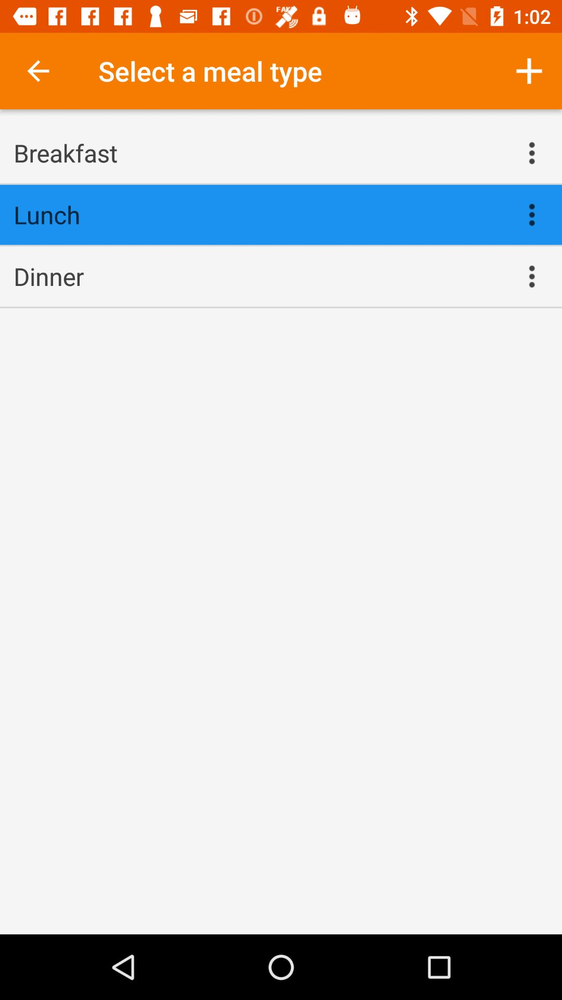

./datasets/filtered_traces/com.eatthismuch/trace_0/screenshots/1890.jpg
com.eatthismuch
com.eatthismuch/com.eatthismuch.activities.meal_type.SelectMealTypeActivity
{"rico_id": "com.eatthismuch-trace_0-1890", "package_name": "com.eatthismuch", "activity_name": "com.eatthismuch/com.eatthismuch.activities.meal_type.SelectMealTypeActivity"}
Similarity Score:  0.17861449934622375 



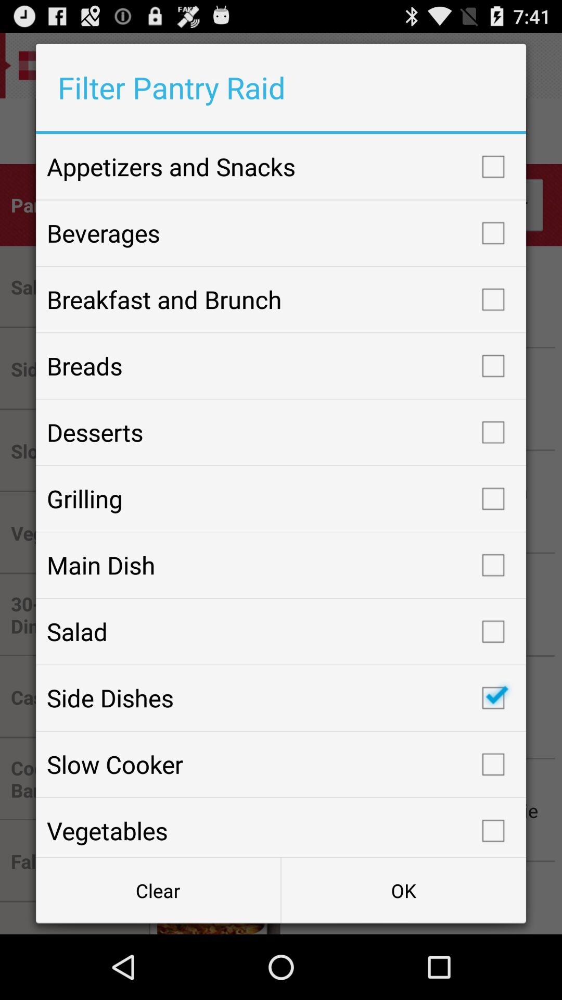

./datasets/filtered_traces/com.meredith.redplaid/trace_0/screenshots/228.jpg
com.meredith.redplaid
com.meredith.redplaid/com.meredith.redplaid.activities.MainActivity
{"rico_id": "com.meredith.redplaid-trace_0-228", "package_name": "com.meredith.redplaid", "activity_name": "com.meredith.redplaid/com.meredith.redplaid.activities.MainActivity"}
Similarity Score:  0.2009849172439565 



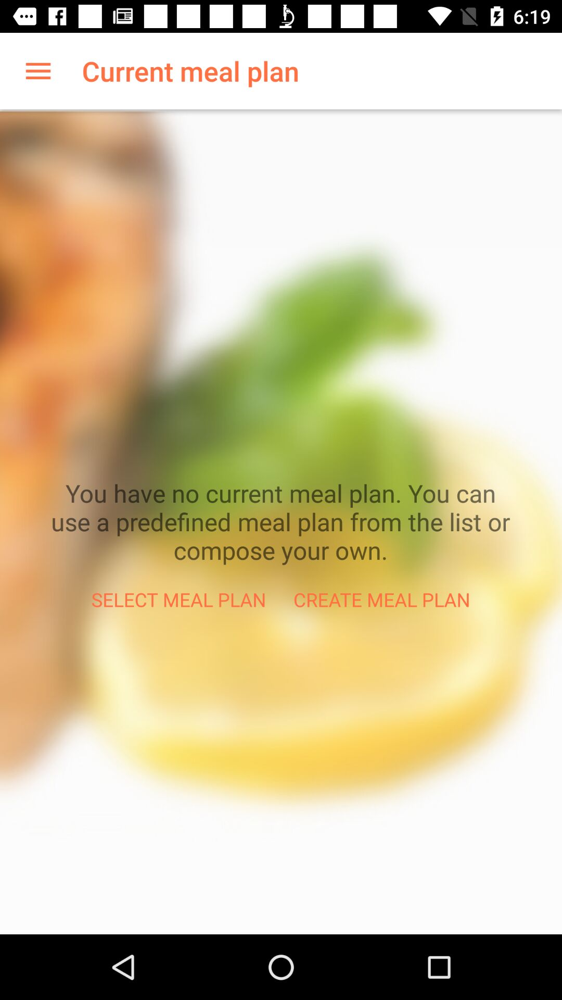

./datasets/filtered_traces/me.lwwd.mealplan/trace_0/screenshots/106.jpg
me.lwwd.mealplan
me.lwwd.mealplan/me.lwwd.mealplan.ui.CurrentMealPlanActivity
{"rico_id": "me.lwwd.mealplan-trace_0-106", "package_name": "me.lwwd.mealplan", "activity_name": "me.lwwd.mealplan/me.lwwd.mealplan.ui.CurrentMealPlanActivity"}
Similarity Score:  0.21498400024877662 



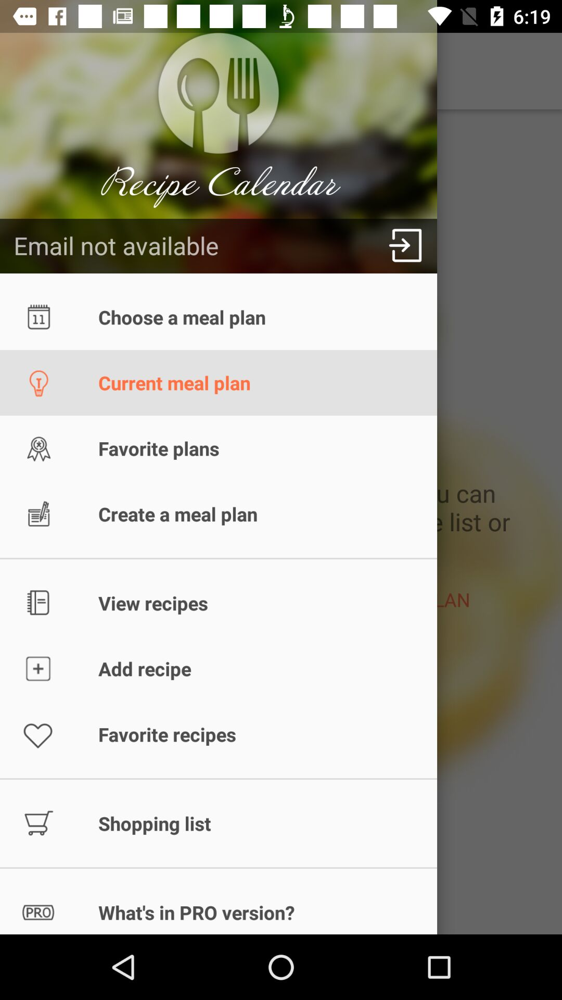

./datasets/filtered_traces/me.lwwd.mealplan/trace_0/screenshots/117.jpg
me.lwwd.mealplan
me.lwwd.mealplan/me.lwwd.mealplan.ui.CurrentMealPlanActivity
{"rico_id": "me.lwwd.mealplan-trace_0-117", "package_name": "me.lwwd.mealplan", "activity_name": "me.lwwd.mealplan/me.lwwd.mealplan.ui.CurrentMealPlanActivity"}
Similarity Score:  0.21498400024877662 



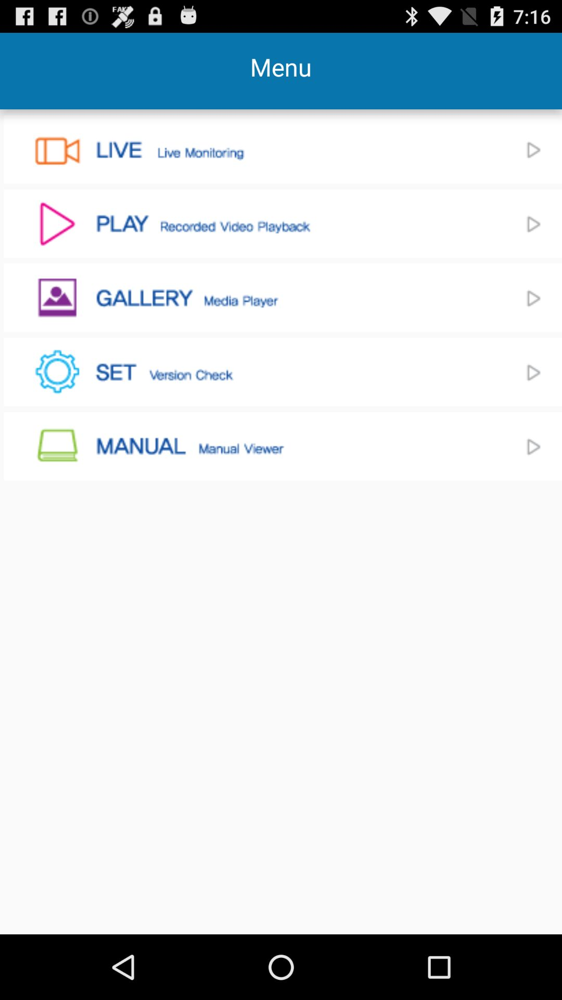

./datasets/filtered_traces/com.rncnetwork.mrpatrol/trace_0/screenshots/4.jpg
com.rncnetwork.mrpatrol
com.rncnetwork.mrpatrol/com.project.common.ChoiceSelectionActivity
{"rico_id": "com.rncnetwork.mrpatrol-trace_0-4", "package_name": "com.rncnetwork.mrpatrol", "activity_name": "com.rncnetwork.mrpatrol/com.project.common.ChoiceSelectionActivity"}
Similarity Score:  0.21572754019015505 



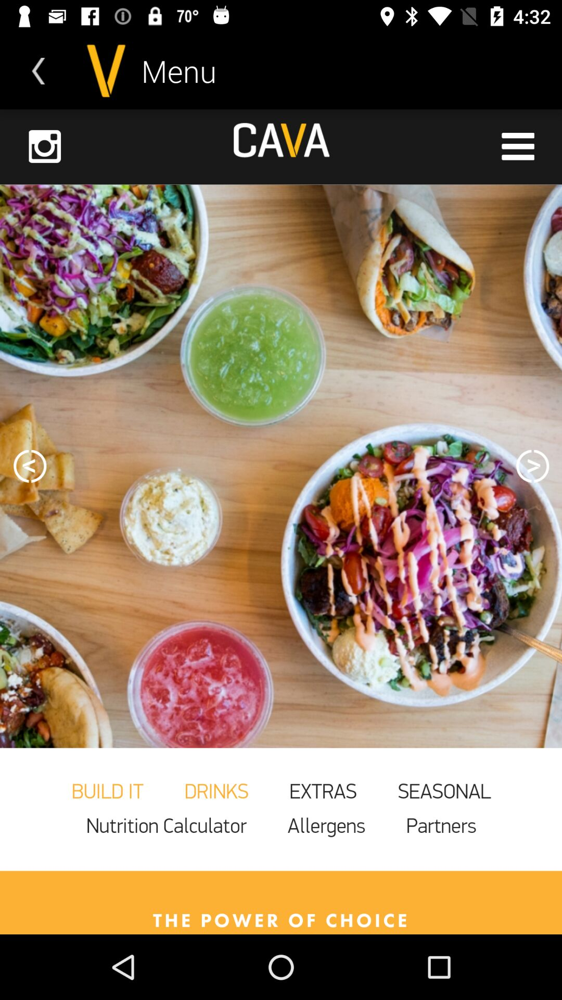

./datasets/filtered_traces/com.cavagrill.cavagrill.android.app/trace_0/screenshots/654.jpg
com.cavagrill.cavagrill.android.app
com.cavagrill.cavagrill.android.app/com.scvngr.levelup.ui.activity.MenuActivity
{"rico_id": "com.cavagrill.cavagrill.android.app-trace_0-654", "package_name": "com.cavagrill.cavagrill.android.app", "activity_name": "com.cavagrill.cavagrill.android.app/com.scvngr.levelup.ui.activity.MenuActivity"}
Similarity Score:  0.21572754019015505 



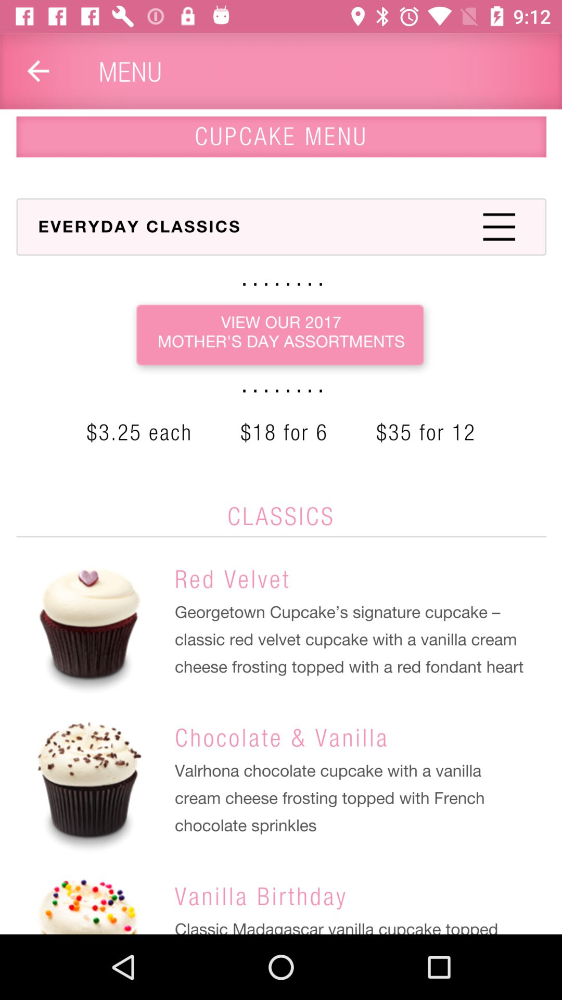

./datasets/filtered_traces/com.georgetowncupcake.georgetowncupcake.android.app/trace_0/screenshots/828.jpg
com.georgetowncupcake.georgetowncupcake.android.app
com.georgetowncupcake.georgetowncupcake.android.app/com.scvngr.levelup.ui.activity.MenuActivity
{"rico_id": "com.georgetowncupcake.georgetowncupcake.android.app-trace_0-828", "package_name": "com.georgetowncupcake.georgetowncupcake.android.app", "activity_name": "com.georgetowncupcake.georgetowncupcake.android.app/com.scvngr.levelup.ui.activity.MenuActivity"}
Similarity Score:  0.21572754019015505 



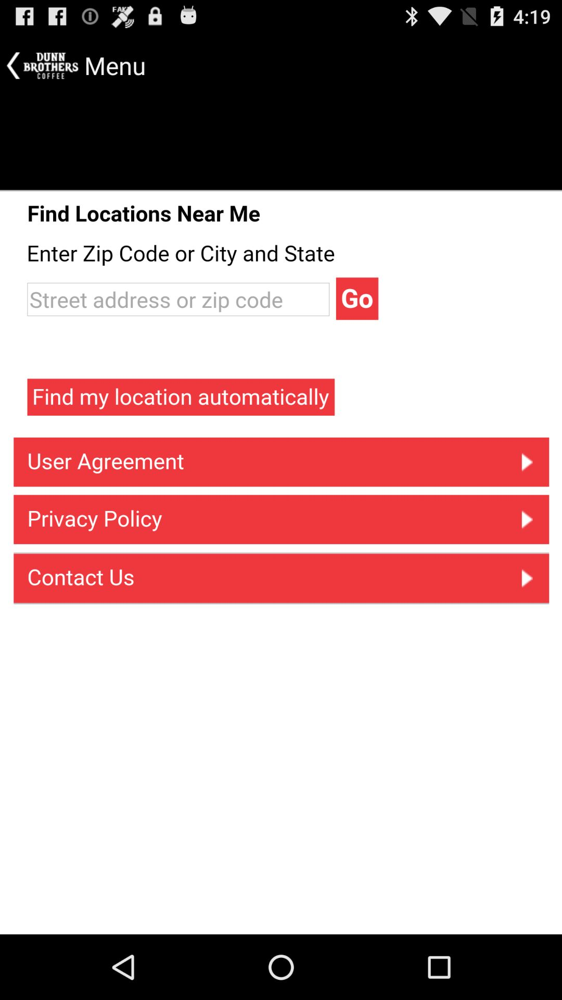

./datasets/filtered_traces/com.dunnbros.android.app/trace_0/screenshots/483.jpg
com.dunnbros.android.app
com.dunnbros.android.app/com.dunnbros.android.activity.OloOrderingActivity
{"rico_id": "com.dunnbros.android.app-trace_0-483", "package_name": "com.dunnbros.android.app", "activity_name": "com.dunnbros.android.app/com.dunnbros.android.activity.OloOrderingActivity"}
Similarity Score:  0.21572754019015505 



In [32]:
# test find screens from utterances

utterance = 'find something to eat'
data_dict_to_use = method1_rico_screen_id_embedding_dict
utterance_embedding = get_embedding_from_text(utterance, data_dict_to_use, sentence_bert_model)

for entry in get_most_relevant_embeddings(utterance_embedding, data_dict_to_use, 10):
    display_rico_result(entry['rico_id'])
    print ("Similarity Score: ", entry['score'], '\n')